# Importation of Libraries and Definition of Helper Functions 

In [191]:
import pandas as pd
import numpy as np
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import train_test_split
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
#
import statsmodels.api as sm
import numpy.ma as ma
from scipy.stats.stats import pearsonr, normaltest
from scipy.spatial.distance import correlation
from statsmodels.tools.tools import add_constant

In [271]:
# A few helper functions

def build_model(features):
    X = add_constant(departure_v_doy[features])
    y = departure_v_doy['departure_delay']
    model = sm.OLS(y,X, missing='drop').fit()
    predictions = model.predict(X) 
    display(model.summary()) 
    res = y - predictions
    
    return res 

def plt_residual(res):
    plt.plot(range(len(res)), res) 
    plt.ylabel('Residual')
    plt.xlabel("Day of Year")

def plt_residual_lag(res, nlag):
    x=res.values
    y=res.shift(nlag).values
    sns.kdeplot(x,y=y,color='blue',shade=True )
    plt.xlabel('res')
    plt.ylabel("res-lag-{}".format(nlag))
    rho,p=corrcoef(x,y)
    plt.title("n_lag={} Day of Year, correlation={:f}".format(nlag+1, rho))
  
def plt_acf(res):
    plt.rcParams['figure.figsize'] = [18, 5]
    acorr = sm.tsa.acf(res.dropna(), nlags = len(res.dropna())-1)
    fig, (ax1, ax2) = plt.subplots(1, 2)
    ax1.plot(acorr)
    ax1.set_ylabel('corr')
    ax1.set_xlabel('n_lag')
    ax1.set_title('Auto Correlation')
    ax2.plot(acorr[:7*4])
    ax2.set_ylabel('corr')
    ax2.set_xlabel('n_lag')
    ax2.set_title('Auto Correlation (1-month zoomed in) ')
    plt.show()
    pd.set_option('display.max_columns', None)
    adf=pd.DataFrame(np.round(acorr[:334],2))
    adf.index.name='day of year'
    display(adf)
    plt.rcParams['figure.figsize'] = [9, 5]
    print("A maximum correlation of %s could be realized with a corresponding time-lag of %s" % (max(adf.drop(index=adf.index[0], axis=0).loc[:,0]),adf.drop(index=adf.index[0], axis=0).loc[:,0].idxmax()+1))

def corrcoef(x,y):
    a,b=ma.masked_invalid(x),ma.masked_invalid(y)
    msk = (~a.mask & ~b.mask)
    return pearsonr(x[msk],y[msk])[0], normaltest(res, nan_policy='omit')[1]

# Data Reading

In [5]:
flights_clean = pd.read_csv('data/flights_clean.csv', low_memory = True) 
flights_clean_numerical = pd.read_csv('data/flights_clean_numerical.csv', low_memory = True)

In [6]:
flights_clean

,airline,day,day_of_week,departure_delay,destination_airport,destination_latitude,destination_longitude,distance,month,origin_airport,...,scheduled_arrival,scheduled_departure,scheduled_time,state_destination,state_origin,taxi_in,taxi_out,day_of_year,origin_temperature,destination_temperature
0,AS,1,4,-11.0,SEA,47.44898,-122.30931,1448,1,ANC,...,270,5,205.0,WA,AK,4.0,21.0,1,35.2,32.9
1,AS,1,4,-4.0,SEA,47.44898,-122.30931,1448,1,ANC,...,309,45,204.0,WA,AK,4.0,17.0,1,35.2,32.9
2,DL,1,4,-14.0,SEA,47.44898,-122.30931,1448,1,ANC,...,315,45,210.0,WA,AK,4.0,25.0,1,35.2,32.9
3,AS,1,4,-15.0,SEA,47.44898,-122.30931,1448,1,ANC,...,393,115,218.0,WA,AK,11.0,17.0,1,35.2,32.9
4,AS,1,4,-11.0,SEA,47.44898,-122.30931,1448,1,ANC,...,400,140,200.0,WA,AK,8.0,15.0,1,35.2,32.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4031914,EV,27,5,77.0,ROA,37.32547,-79.97543,357,11,ATL,...,648,565,83.0,VA,GA,3.0,9.0,331,59.7,49.4
4031915,EV,27,5,-6.0,ROA,37.32547,-79.97543,357,11,ATL,...,985,902,83.0,VA,GA,5.0,21.0,331,59.7,49.4
4031916,DL,27,5,-1.0,ROA,37.32547,-79.97543,357,11,ATL,...,1162,1079,83.0,VA,GA,6.0,22.0,331,59.7,49.4
4031917,EV,19,6,88.0,ABE,40.65236,-75.44040,692,12,ATL,...,934,821,113.0,PA,GA,3.0,22.0,353,37.8,35.6


In [9]:
flights_clean_numerical

,day,day_of_week,departure_delay,destination_latitude,destination_longitude,distance,month,origin_latitude,origin_longitude,scheduled_arrival,...,state_origin_SD,state_origin_TN,state_origin_TX,state_origin_UT,state_origin_VA,state_origin_VT,state_origin_WA,state_origin_WI,state_origin_WV,state_origin_WY
0,1,4,-11.0,47.44898,-122.30931,1448,1,61.17432,-149.99619,270,...,0,0,0,0,0,0,0,0,0,0
1,1,4,-4.0,47.44898,-122.30931,1448,1,61.17432,-149.99619,309,...,0,0,0,0,0,0,0,0,0,0
2,1,4,-14.0,47.44898,-122.30931,1448,1,61.17432,-149.99619,315,...,0,0,0,0,0,0,0,0,0,0
3,1,4,-15.0,47.44898,-122.30931,1448,1,61.17432,-149.99619,393,...,0,0,0,0,0,0,0,0,0,0
4,1,4,-11.0,47.44898,-122.30931,1448,1,61.17432,-149.99619,400,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3377182,2,3,-7.0,42.36435,-71.00518,187,12,40.63975,-73.77893,605,...,0,0,0,0,0,0,0,0,0,0
3377183,2,3,-10.0,42.36435,-71.00518,187,12,40.63975,-73.77893,623,...,0,0,0,0,0,0,0,0,0,0
3377184,2,3,3.0,42.36435,-71.00518,187,12,40.63975,-73.77893,742,...,0,0,0,0,0,0,0,0,0,0
3377185,2,3,52.0,42.36435,-71.00518,187,12,40.63975,-73.77893,807,...,0,0,0,0,0,0,0,0,0,0


In [8]:
flights_clean_numerical.columns # 22 columns

Index(['day', 'day_of_week', 'departure_delay', 'destination_latitude',
       'destination_longitude', 'distance', 'month', 'origin_latitude',
       'origin_longitude', 'scheduled_arrival',
       ...
       'state_origin_SD', 'state_origin_TN', 'state_origin_TX',
       'state_origin_UT', 'state_origin_VA', 'state_origin_VT',
       'state_origin_WA', 'state_origin_WI', 'state_origin_WV',
       'state_origin_WY'],
      dtype='object', length=407)

In [11]:
flights_clean.columns

Index(['airline', 'day', 'day_of_week', 'departure_delay',
       'destination_airport', 'destination_latitude', 'destination_longitude',
       'distance', 'month', 'origin_airport', 'origin_latitude',
       'origin_longitude', 'scheduled_arrival', 'scheduled_departure',
       'scheduled_time', 'state_destination', 'state_origin', 'taxi_in',
       'taxi_out', 'day_of_year', 'origin_temperature',
       'destination_temperature'],
      dtype='object')

# Data Preparation

#### General Sample Extraction Method

In [10]:
flights_clean.columns # 22 columns

Index(['airline', 'day', 'day_of_week', 'departure_delay',
       'destination_airport', 'destination_latitude', 'destination_longitude',
       'distance', 'month', 'origin_airport', 'origin_latitude',
       'origin_longitude', 'scheduled_arrival', 'scheduled_departure',
       'scheduled_time', 'state_destination', 'state_origin', 'taxi_in',
       'taxi_out', 'day_of_year', 'origin_temperature',
       'destination_temperature'],
      dtype='object')

The frequency ratio of the most and least recurrenct value for origin_airport is:  355.5
The frequency ratio of the most and least recurrenct value for destination_airport is:  731.0


<AxesSubplot:title={'center':'Frequency Distribution of destination_airport'}>

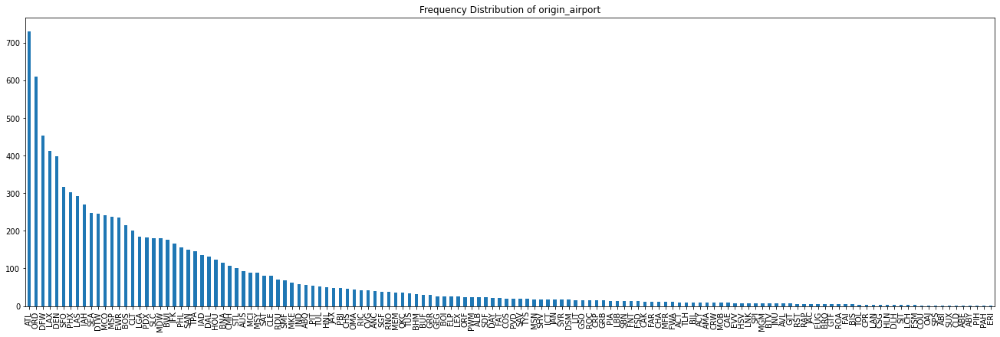

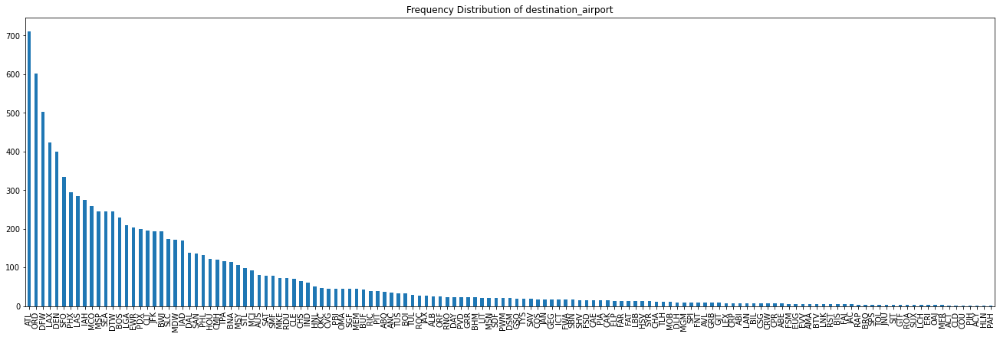

In [11]:
# A random sample of flight data contained therein is extracted without considering any potential covariate shifts 
# of any flight characterics.

flights_sample1 = flights_clean.sample(n=10000)
flights_sample1.origin_airport.value_counts()

# One way of assessing the distribution of our data is by finding the ratio of the frequency of the most recurrent 
# value to the frequency of the least recurrent value in an essential column, such as origin_airport and 
# destination_airport, which already implicitly takes into account city and state. 

origin_freq = max(flights_sample1.origin_airport.value_counts())/min(flights_sample1.origin_airport.value_counts())
print('The frequency ratio of the most and least recurrenct value for origin_airport is: ',origin_freq )
destination_freq = max(flights_sample1.destination_airport.value_counts())/min(flights_sample1.destination_airport.value_counts())
print('The frequency ratio of the most and least recurrenct value for destination_airport is: ',destination_freq )

plt.figure(figsize=(18,6), layout = 'constrained')
plt.title('Frequency Distribution of origin_airport')
flights_sample1.destination_airport.value_counts().plot(kind='bar')

plt.figure(figsize=(18,6), layout = 'constrained')
plt.title('Frequency Distribution of destination_airport')
flights_sample1.origin_airport.value_counts().plot(kind='bar')

#### Unidimensional Data-Balancing Sample Extraction Method

In [12]:
flights_sample21 = flights_clean.groupby(['origin_airport']).apply(lambda x:x.sample(100))

origin_freq = max(flights_sample21.origin_airport.value_counts())/min(flights_sample21.origin_airport.value_counts())
print('The frequency ratio of the most and least recurrenct value for origin_airport is: ',origin_freq )
destination_freq = max(flights_sample21.destination_airport.value_counts())/min(flights_sample21.destination_airport.value_counts())
print('The frequency ratio of the most and least recurrenct value for destination_airport is: ',destination_freq )

The frequency ratio of the most and least recurrenct value for origin_airport is:  1.0
The frequency ratio of the most and least recurrenct value for destination_airport is:  2080.0


<AxesSubplot:>

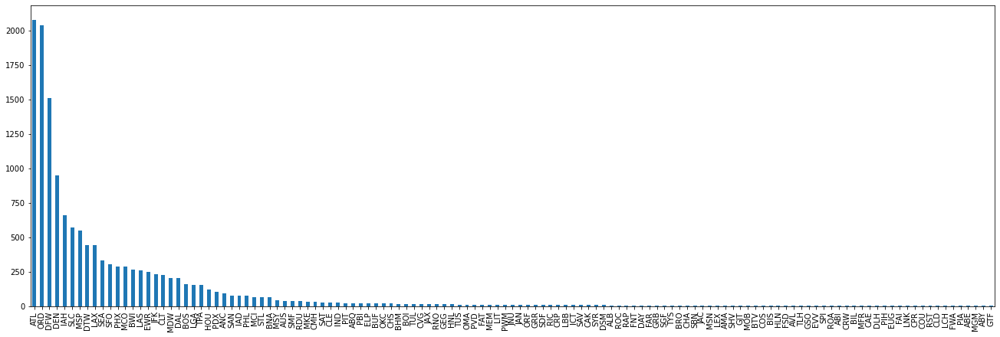

In [13]:
plt.figure(figsize=(18,6), layout = 'constrained')
flights_sample21.destination_airport.value_counts().plot(kind='bar')

In [14]:
flights_sample22 = flights_clean.groupby(['destination_airport']).apply(lambda x:x.sample(100))

origin_freq = max(flights_sample22.origin_airport.value_counts())/min(flights_sample22.origin_airport.value_counts())
print('The frequency ratio of the most and least recurrenct value for origin_airport is: ',origin_freq )
destination_freq = max(flights_sample22.destination_airport.value_counts())/min(flights_sample22.destination_airport.value_counts())
print('The frequency ratio of the most and least recurrenct value for destination_airport is: ',destination_freq )

The frequency ratio of the most and least recurrenct value for origin_airport is:  2085.0
The frequency ratio of the most and least recurrenct value for destination_airport is:  1.0


<AxesSubplot:>

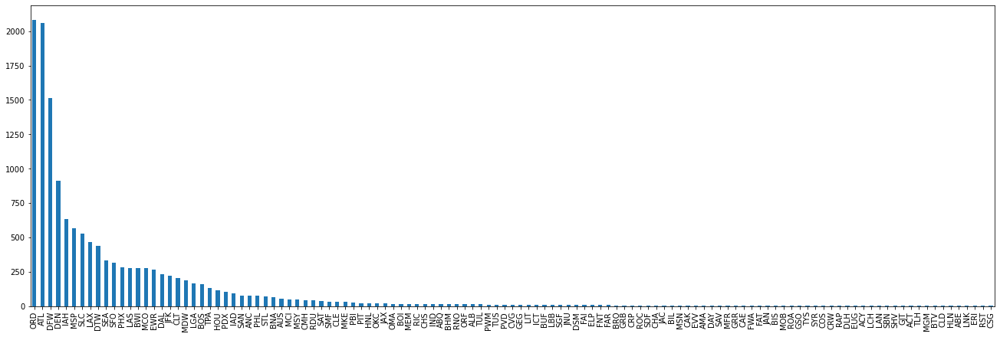

In [15]:
plt.figure(figsize=(18,6), layout = 'constrained')
flights_sample22.origin_airport.value_counts().plot(kind='bar')

#### Multidimensional Data-Balancing Sample Extraction Method

In [16]:
# Create two dataframes that are each derived using the previous method and then concatenate them.

flights_samplen1 = flights_clean.groupby(['origin_airport'], as_index = False).apply(lambda x:x.sample(200))
flights_samplen2 = flights_clean.groupby(['destination_airport'], as_index = False).apply(lambda x:x.sample(200))

flights_samplen1 = flights_samplen1.reset_index().drop(columns = ['level_1','level_0'])
flights_samplen2 = flights_samplen2.reset_index().drop(columns = ['level_1','level_0'])

# Concatenation of Both DataFrames flights_sample1 and flights_sample2
flights_sample3 = pd.concat([flights_samplen1,flights_samplen2], axis=0).drop_duplicates()

origin_freq = max(flights_sample3.origin_airport.value_counts())/min(flights_sample3.origin_airport.value_counts())
print('The frequency ratio of the most and least recurrenct value for origin_airport is: ',origin_freq )
destination_freq = max(flights_sample3.destination_airport.value_counts())/min(flights_sample3.destination_airport.value_counts())
print('The frequency ratio of the most and least recurrenct value for destination_airport is: ',destination_freq )

The frequency ratio of the most and least recurrenct value for origin_airport is:  22.315
The frequency ratio of the most and least recurrenct value for destination_airport is:  22.215


<AxesSubplot:>

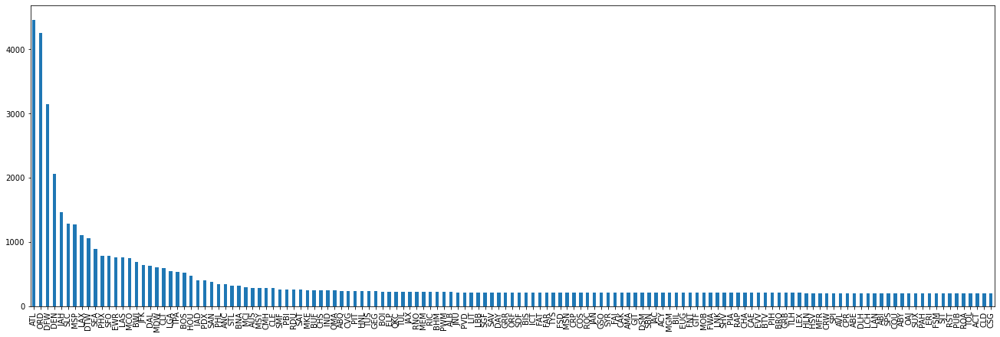

In [17]:
plt.figure(figsize=(18,6), layout = 'constrained')
flights_sample3.origin_airport.value_counts().plot(kind='bar')

<AxesSubplot:>

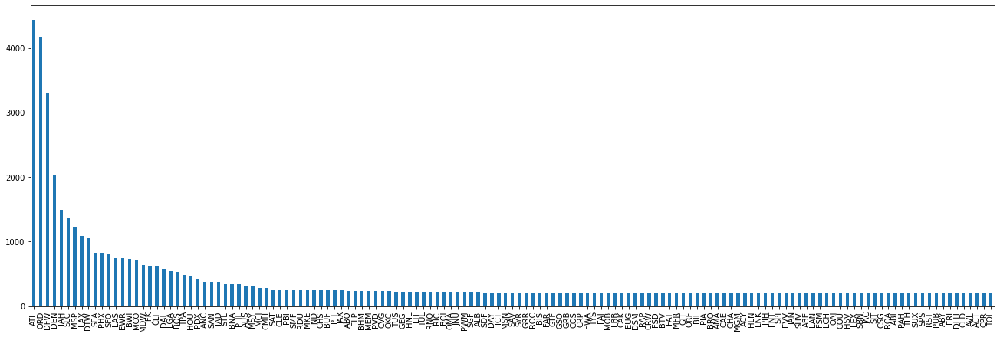

In [18]:
plt.figure(figsize=(18,6), layout = 'constrained')
flights_sample3.destination_airport.value_counts().plot(kind='bar')

### Assessing the Possibility of Substantial **Covariate Shifts** between Sample (Train) and Whole Dataset (Test)

In [19]:
max(flights_clean.origin_airport.value_counts())/min(flights_clean.origin_airport.value_counts())
max(flights_clean.destination_airport.value_counts())/min(flights_clean.destination_airport.value_counts())

origin_freq = max(flights_clean.origin_airport.value_counts())/min(flights_clean.origin_airport.value_counts())
print('The frequency ratio of the most and least recurrenct value for origin_airport is: ',origin_freq )
destination_freq = max(flights_clean.destination_airport.value_counts())/min(flights_clean.destination_airport.value_counts())
print('The frequency ratio of the most and least recurrenct value for destination_airport is: ',destination_freq )

The frequency ratio of the most and least recurrenct value for origin_airport is:  1108.5533596837945
The frequency ratio of the most and least recurrenct value for destination_airport is:  1100.1333333333334


<AxesSubplot:>

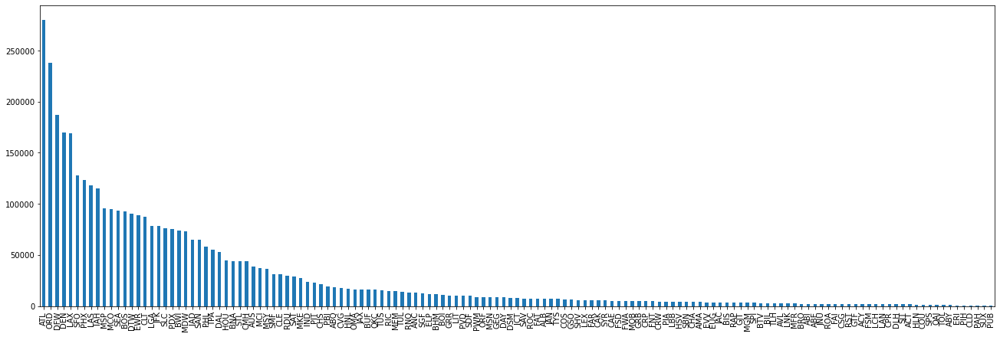

In [20]:
plt.figure(figsize=(18,6), layout = 'constrained')
flights_clean.origin_airport.value_counts().plot(kind='bar')

<AxesSubplot:>

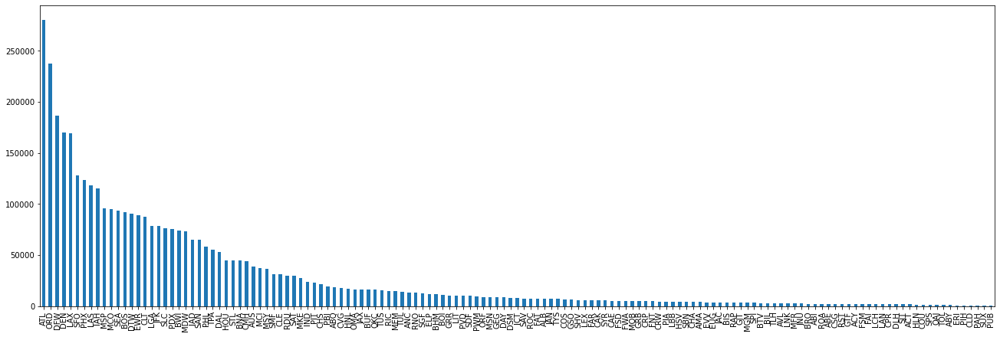

In [21]:
plt.figure(figsize=(18,6), layout = 'constrained')
flights_clean.destination_airport.value_counts().plot(kind='bar')

In [22]:
from scipy.stats import ttest_ind

stat, p_value = ttest_ind(flights_sample1.destination_airport.value_counts(), flights_clean.destination_airport.value_counts())
print(f"t-test: statistic={stat:.4f}, p-value={p_value:.4f}")


t-test: statistic=-7.2158, p-value=0.0000


In [23]:
from scipy.stats import mannwhitneyu

stat, p_value = mannwhitneyu(flights_sample1.destination_airport.value_counts(), flights_clean.destination_airport.value_counts())
print(f" Mann–Whitney U Test: statistic={stat:.4f}, p-value={p_value:.4f}")


 Mann–Whitney U Test: statistic=15.0000, p-value=0.0000


**EDA:** It seems that given the statistic values and p-values derived from both the t-tests and Mann-Whitney U Tests and given our observation of the frequency distribution of the airports in all the samples and the overall dataset, the first sample, flights_sample1, may be the safest and most representative training set of all.

# Data Visualization and Statistical Analysis 

### Pairplot

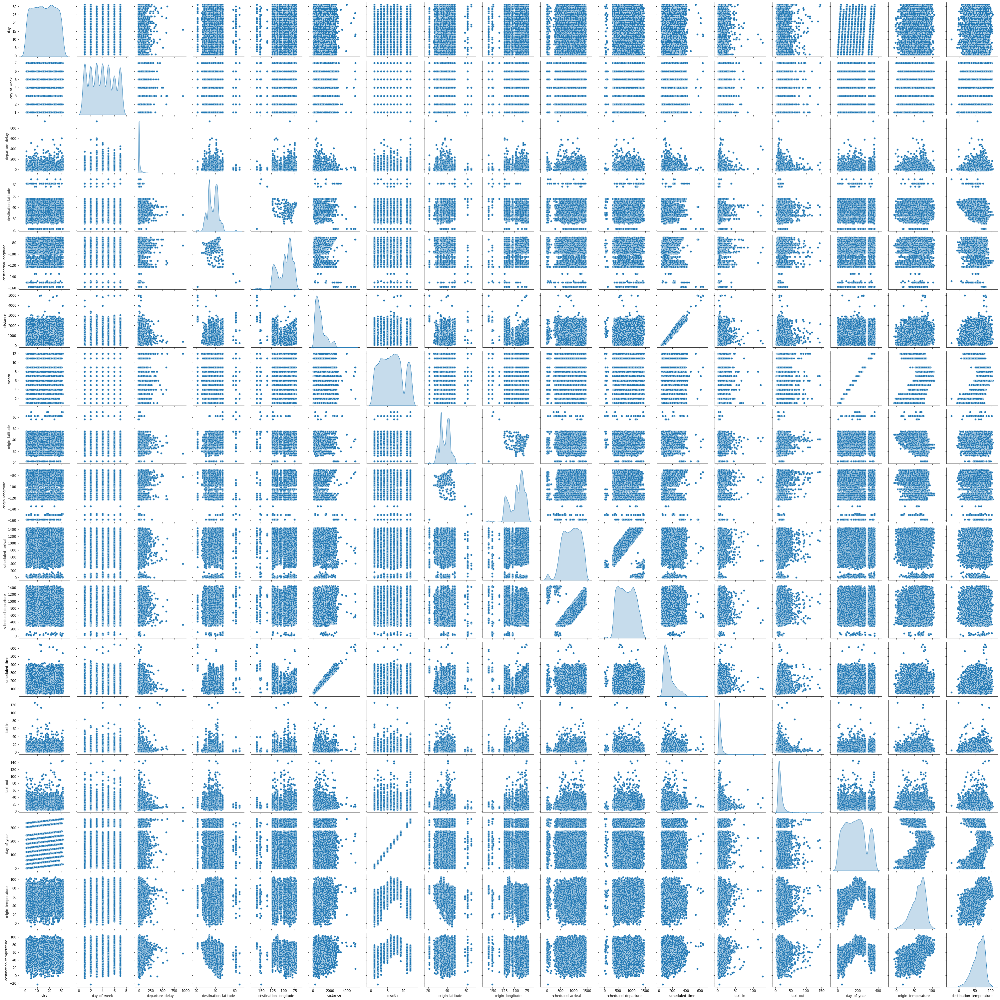

In [24]:
sns.pairplot(data=flights_sample1, diag_kind='kde')


**EDA:** The most important row on this pairplot is the row that includes the relationships of all the variables against departure_delay. From a glance, one could see that there are some particular variables that most likely have a significant relationship that could advantegously be used in our ultimate inference model and could also see that certain predictor variables also have a significant relationship with other predictor variables, of which most, if not all, can be ignored given that they are expected to manifest such a trend, i.e. day_of_year and month.

### Correleation Analysis

In [25]:
# Create correlation matrix
corr_matrix = flights_sample1.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.30
highcorr_matrix = upper[(upper > 0.45)]

highcorr_mat = highcorr_matrix.dropna(how='all')
highcorr_mat

,day,day_of_week,departure_delay,destination_latitude,destination_longitude,distance,month,origin_latitude,origin_longitude,scheduled_arrival,scheduled_departure,scheduled_time,taxi_in,taxi_out,day_of_year,origin_temperature,destination_temperature
distance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.983765,NaN,NaN,NaN,NaN,NaN
month,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.99632,NaN,NaN
scheduled_arrival,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.672961,NaN,NaN,NaN,NaN,NaN,NaN
origin_temperature,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.66808


**EDA:** After filtering out the correleation values that are less than 0.45, it seems that there are only a few pair of variables that have a significant degree of correleation with each other, indiciating potential multicollinearity between them.

### Analysis of Potential Variable Interactions and Transformations 

In [27]:
flights_sample1.columns

Index(['airline', 'day', 'day_of_week', 'departure_delay',
       'destination_airport', 'destination_latitude', 'destination_longitude',
       'distance', 'month', 'origin_airport', 'origin_latitude',
       'origin_longitude', 'scheduled_arrival', 'scheduled_departure',
       'scheduled_time', 'state_destination', 'state_origin', 'taxi_in',
       'taxi_out', 'day_of_year', 'origin_temperature',
       'destination_temperature'],
      dtype='object')

#### Scatter Plots of Numeric Predictors Against Response Variable

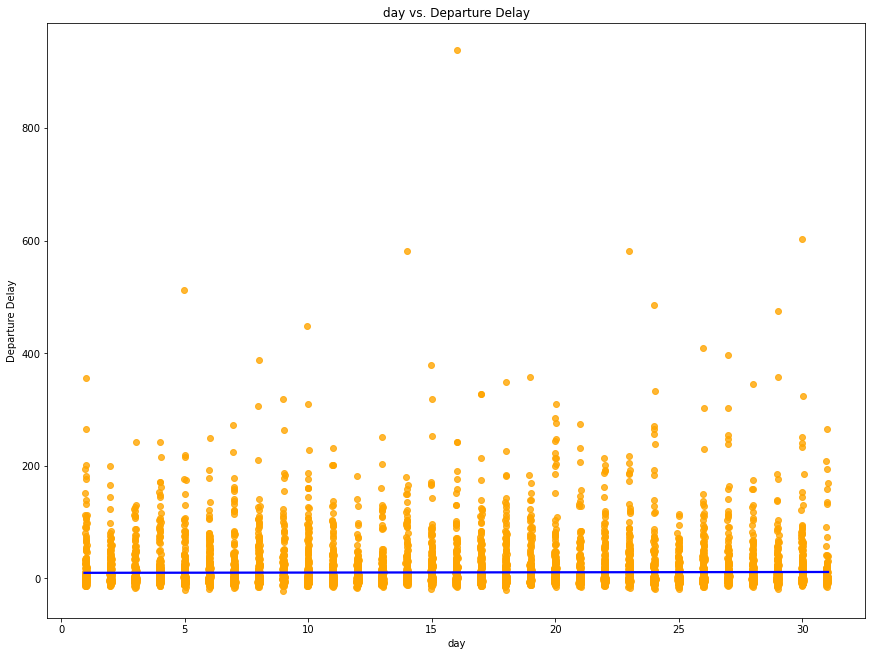

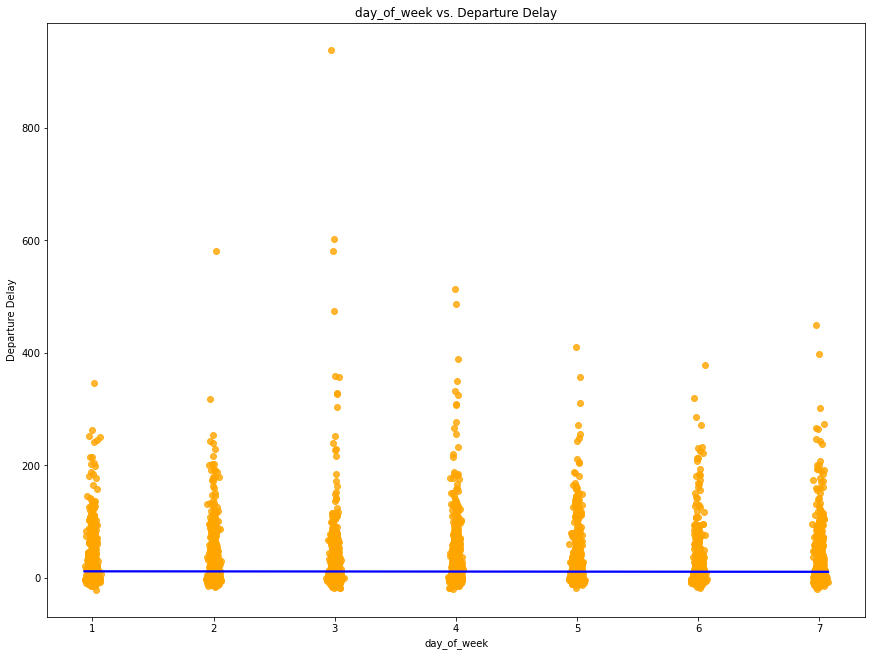

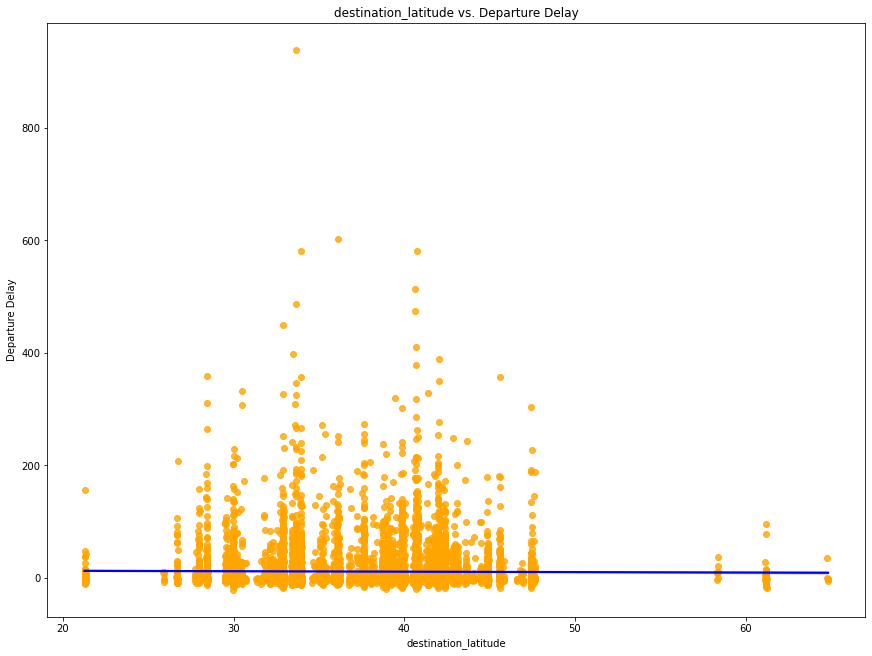

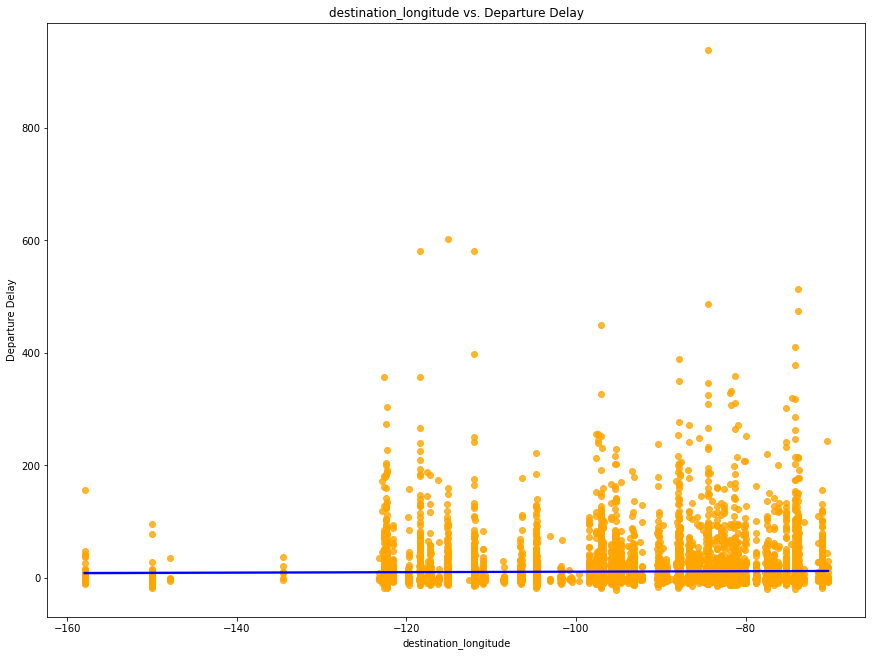

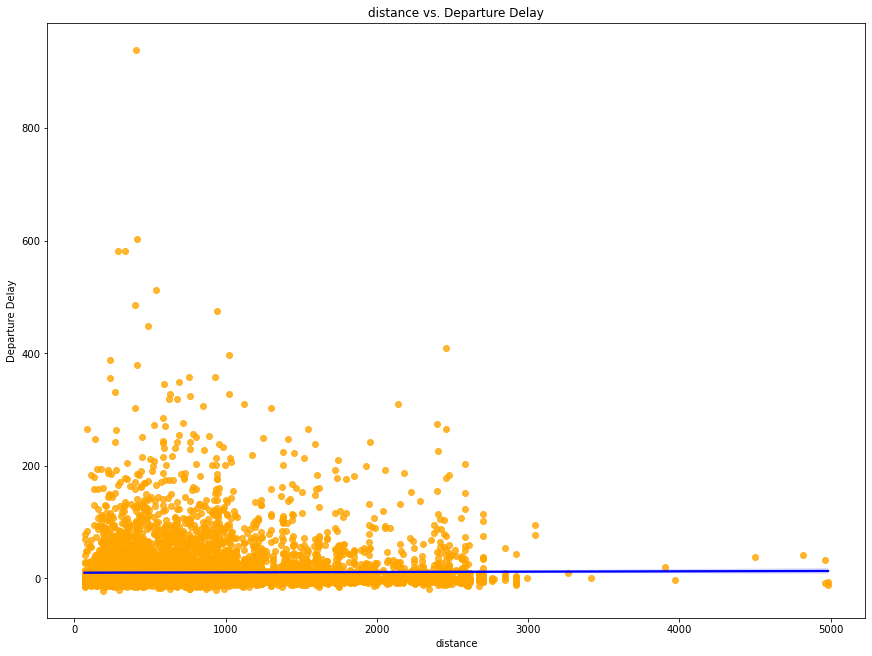

...

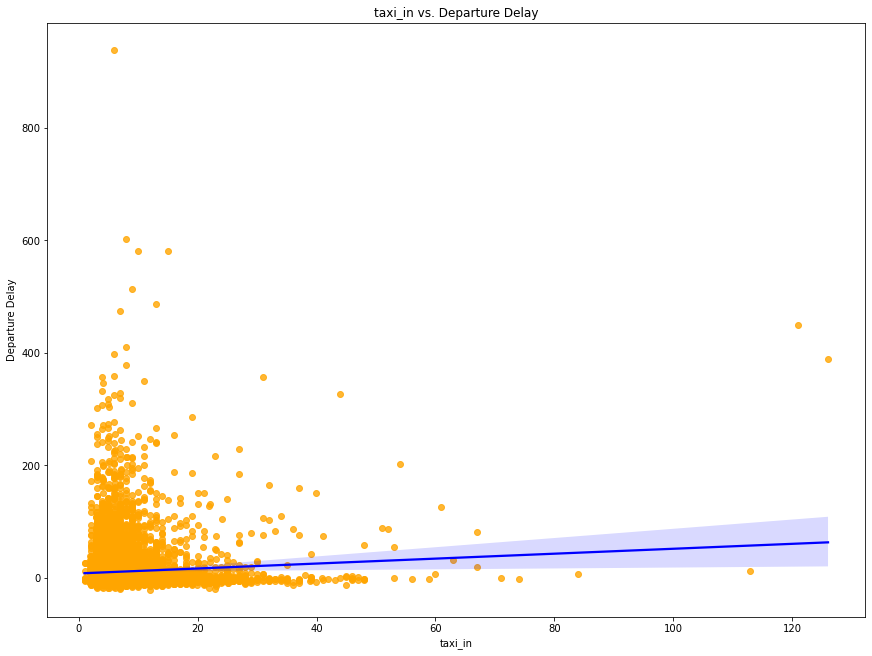

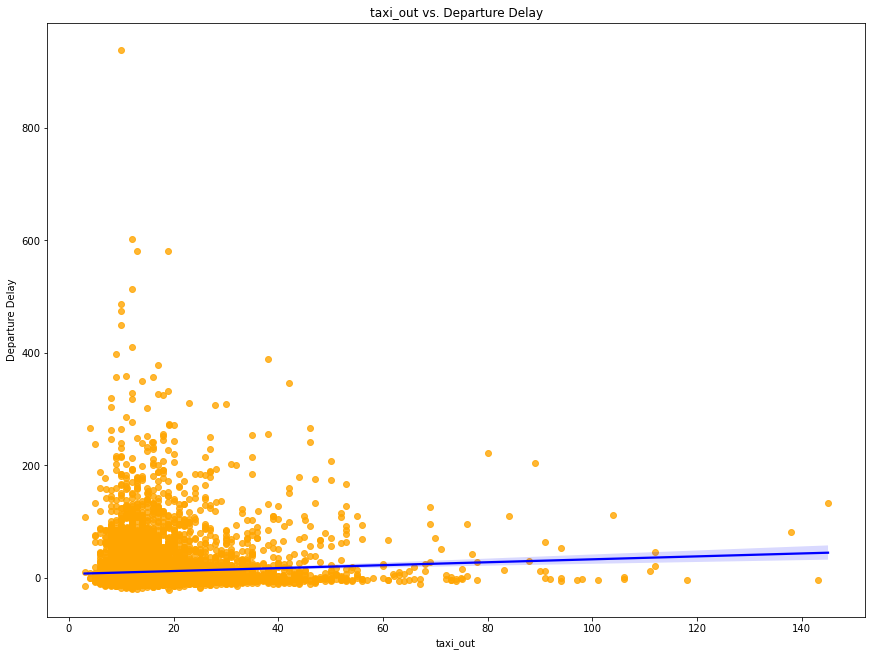

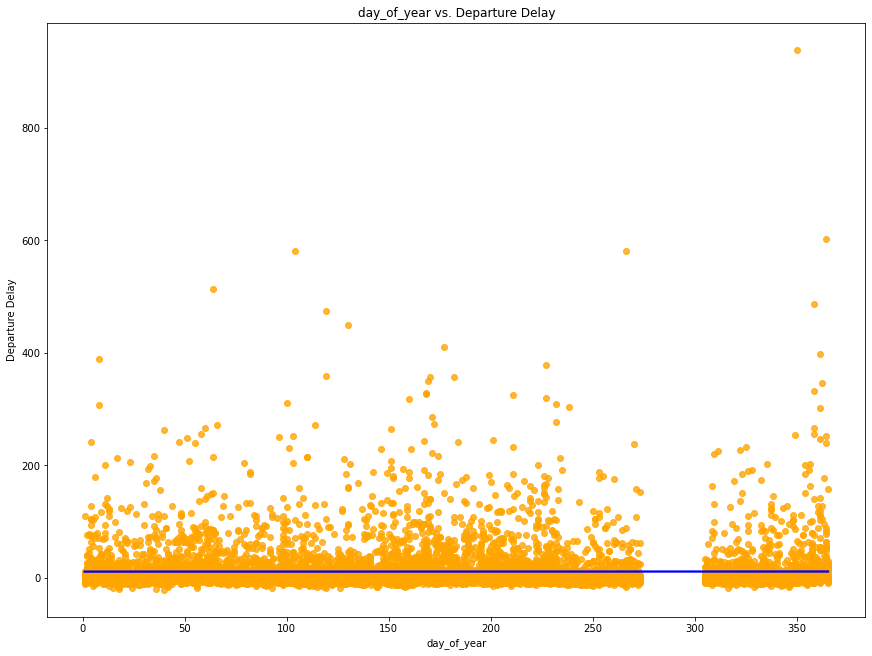

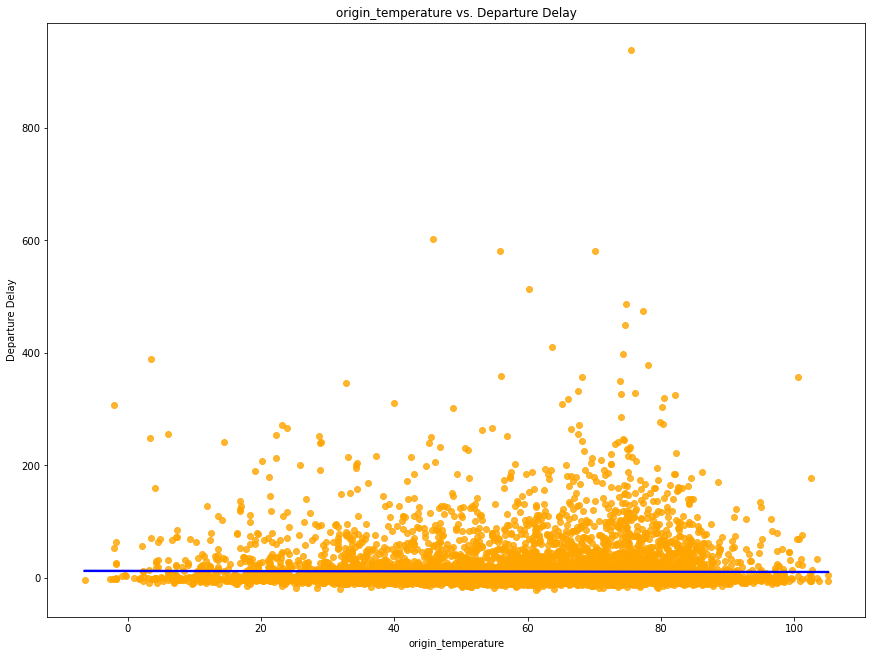

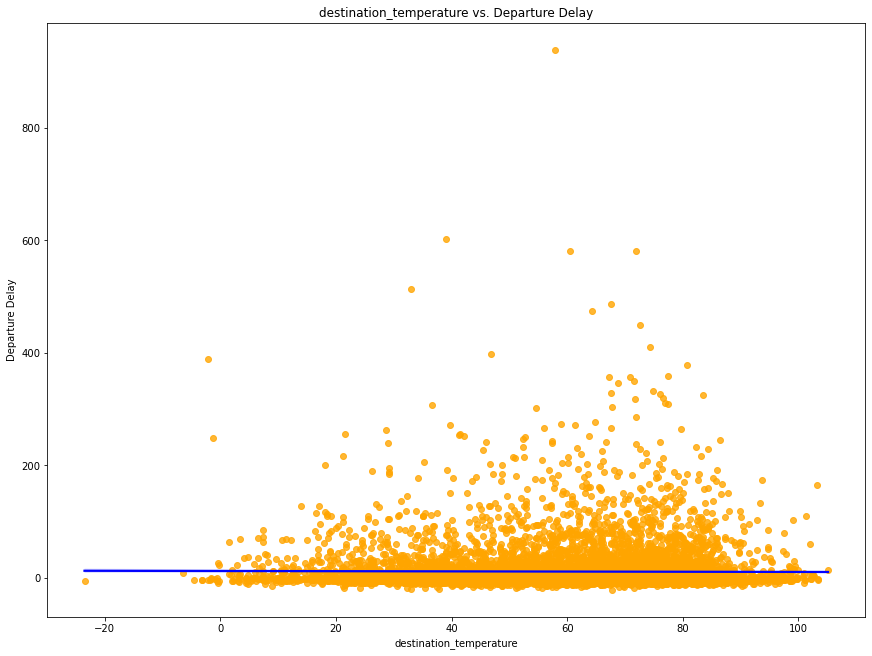

Non-Numeric Predictors, which were not included in the above plots, are:  ['airline', 'destination_airport', 'origin_airport', 'state_destination', 'state_origin']


In [31]:
#Jittering points to better see the density of points in any given region of the plot
def jitter(values,j):
    return values + np.random.normal(j,0.02,values.shape)

non_numeric_columns = []

for i in flights_sample1.columns:
    if (flights_sample1[str(i)].dtype == 'int64' or flights_sample1[str(i)].dtype == 'float64') and (str(i) != 'departure_delay') :
        plt.figure(figsize=(12,9), layout = 'constrained')
        #plt.scatter(jitter(flights_sample[i],0),jitter(flights_sample['departure_delay'],0))
        sns.regplot(x = jitter(flights_sample1[i],0), y = jitter(flights_sample1['departure_delay'],0),color = 'orange', line_kws = {'color':'blue'})
        plt.title(str(i) + ' vs. Departure Delay')
        plt.xlabel(str(i))
        plt.ylabel('Departure Delay')
        # Show/save figure as desired.
        plt.show()
    else:
        non_numeric_columns.append(str(i))
non_numeric_columns.remove('departure_delay')
print("Non-Numeric Predictors, which were not included in the above plots, are: ", non_numeric_columns)


#### (Gaussian) Kernel Density Estimate Plots of Numeric Predictors Against departure_delay

<Figure size 864x648 with 0 Axes>

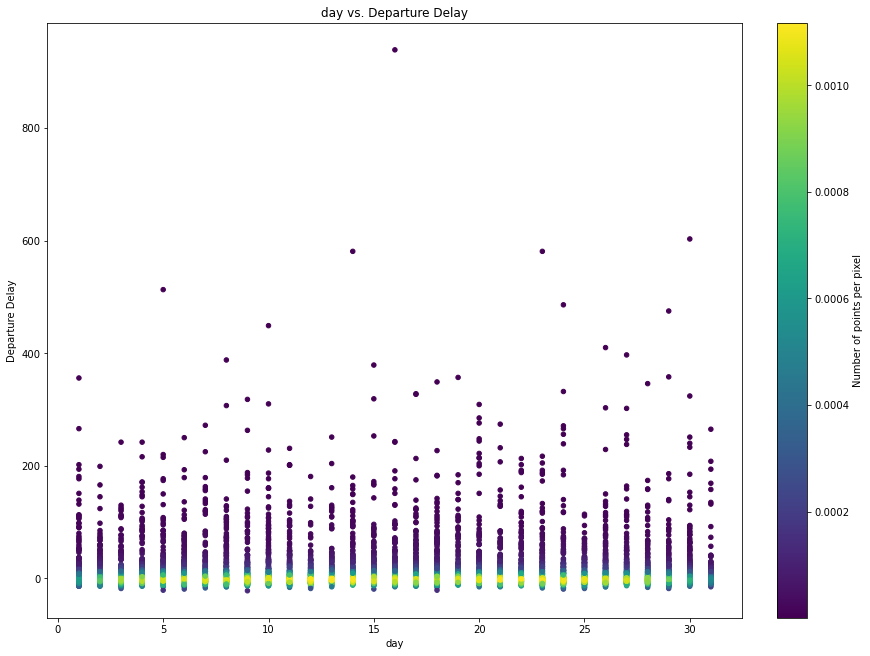

<Figure size 864x648 with 0 Axes>

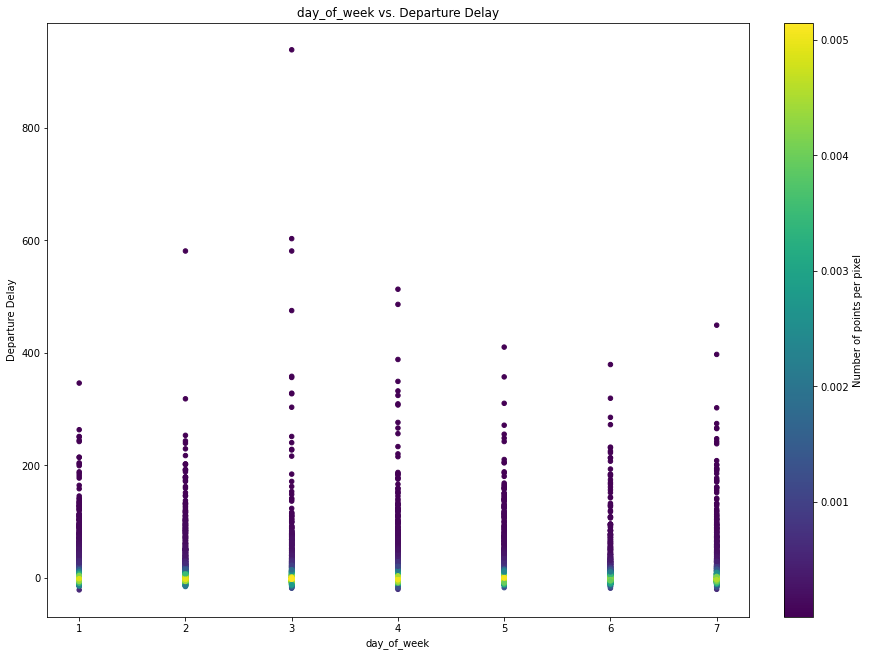

<Figure size 864x648 with 0 Axes>

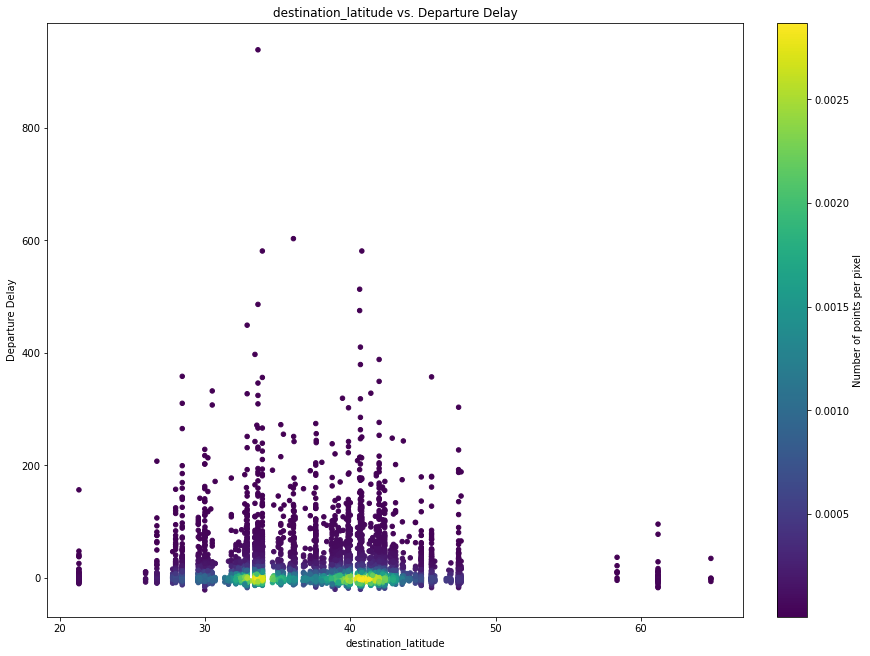

<Figure size 864x648 with 0 Axes>

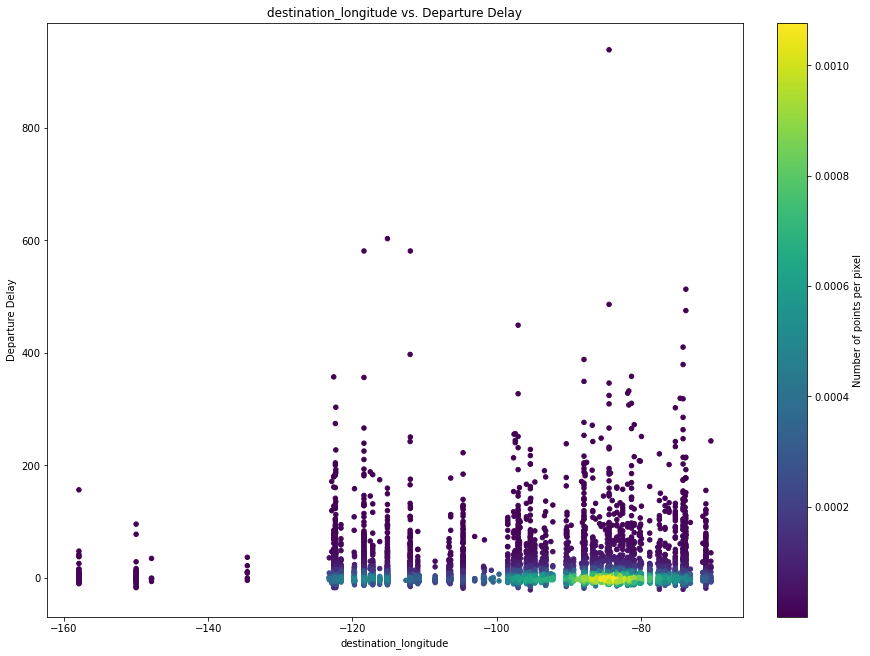

<Figure size 864x648 with 0 Axes>

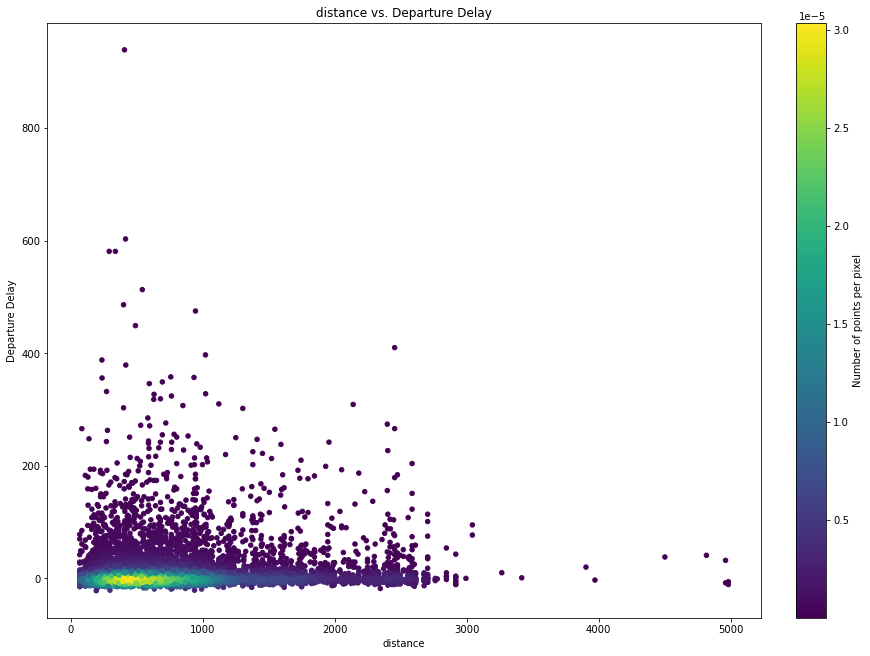

<Figure size 864x648 with 0 Axes>

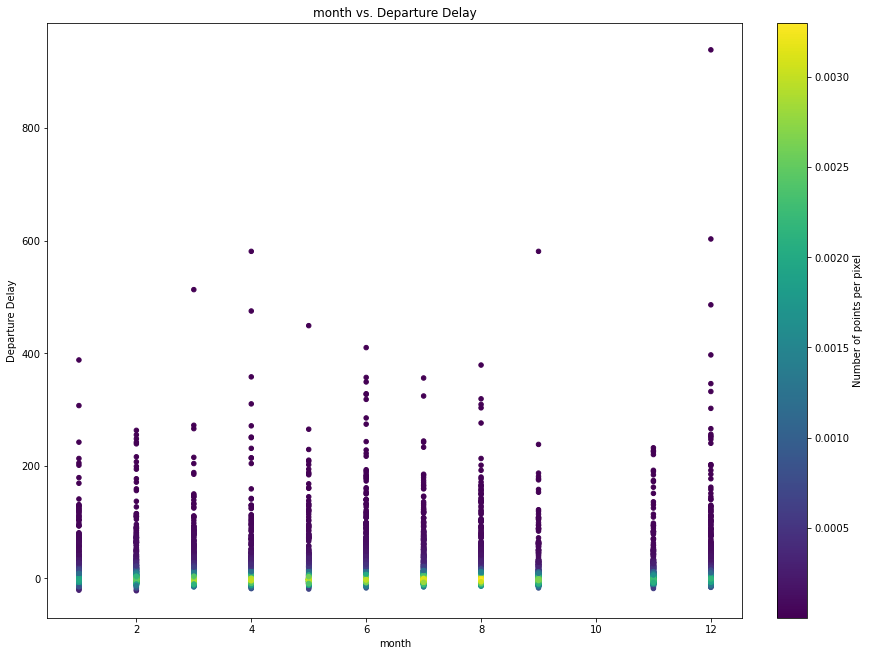

<Figure size 864x648 with 0 Axes>

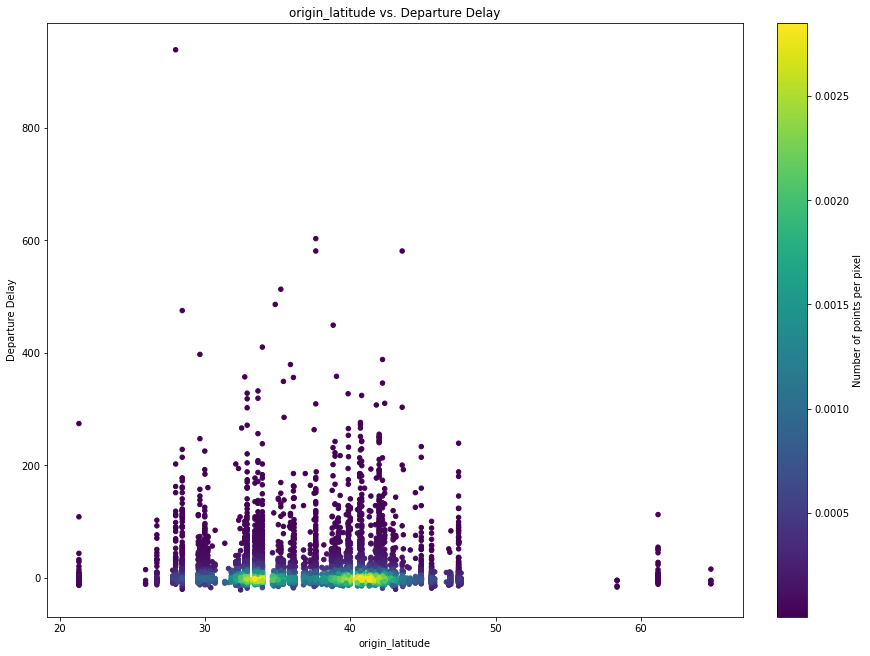

<Figure size 864x648 with 0 Axes>

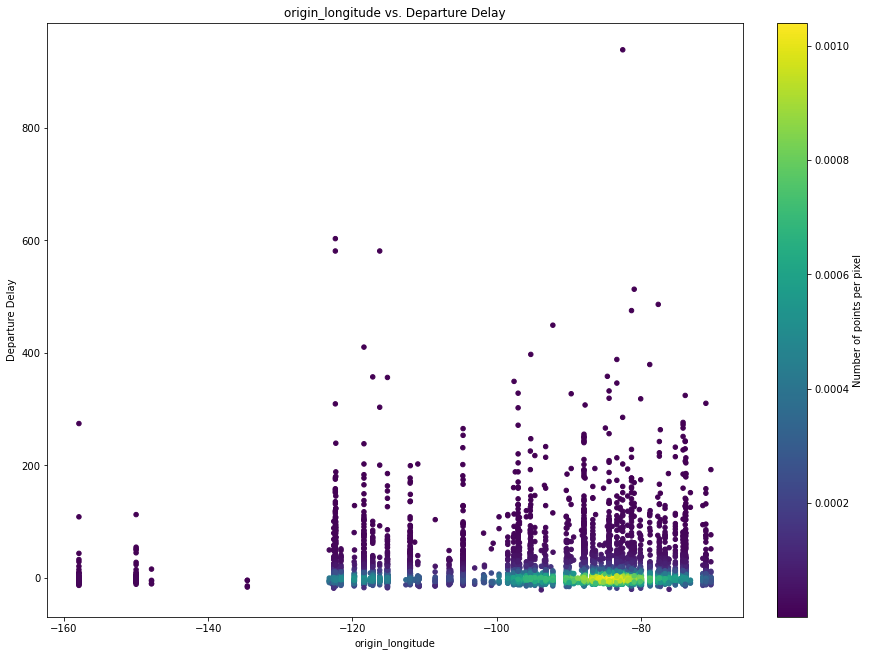

<Figure size 864x648 with 0 Axes>

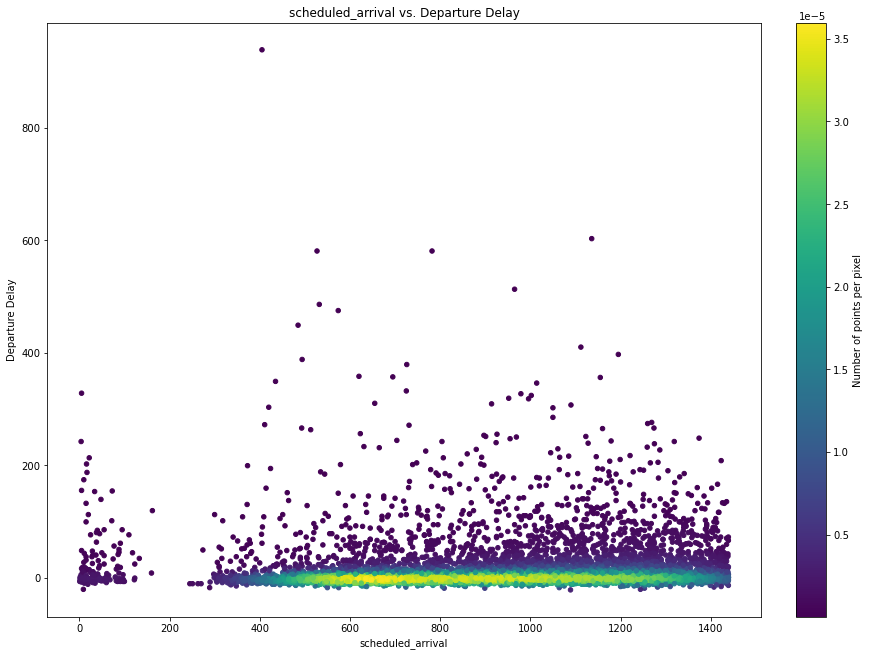

<Figure size 864x648 with 0 Axes>

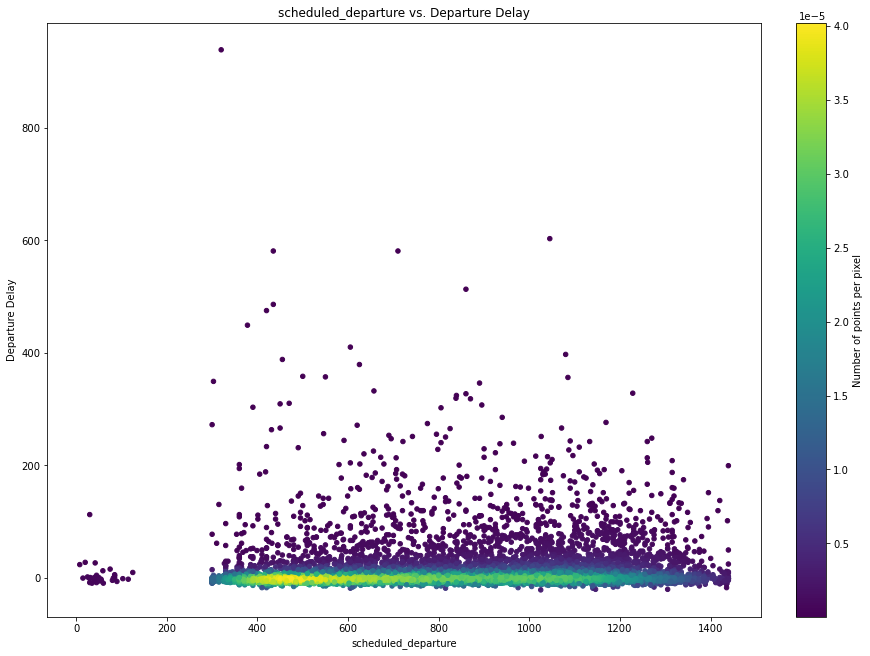

<Figure size 864x648 with 0 Axes>

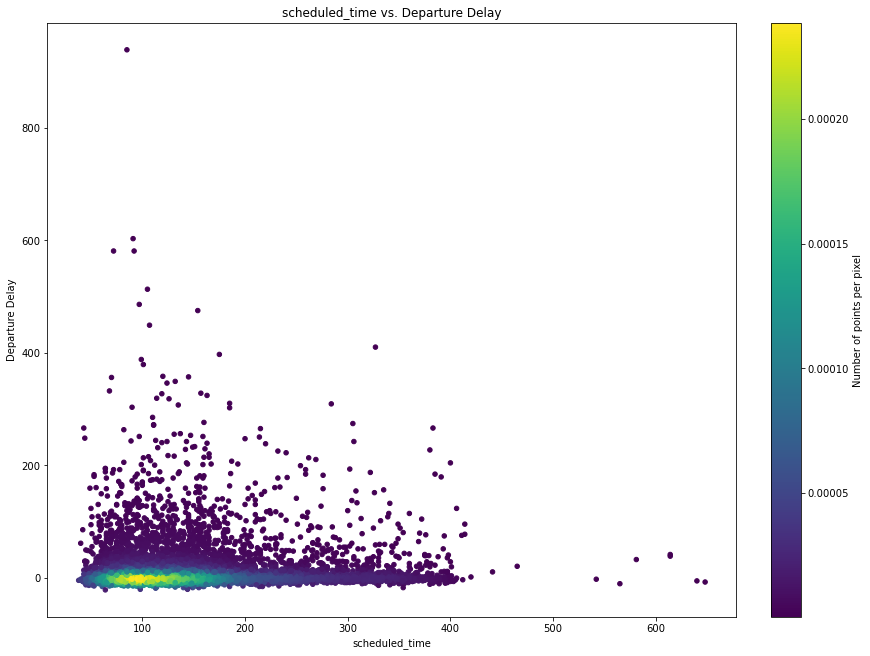

<Figure size 864x648 with 0 Axes>

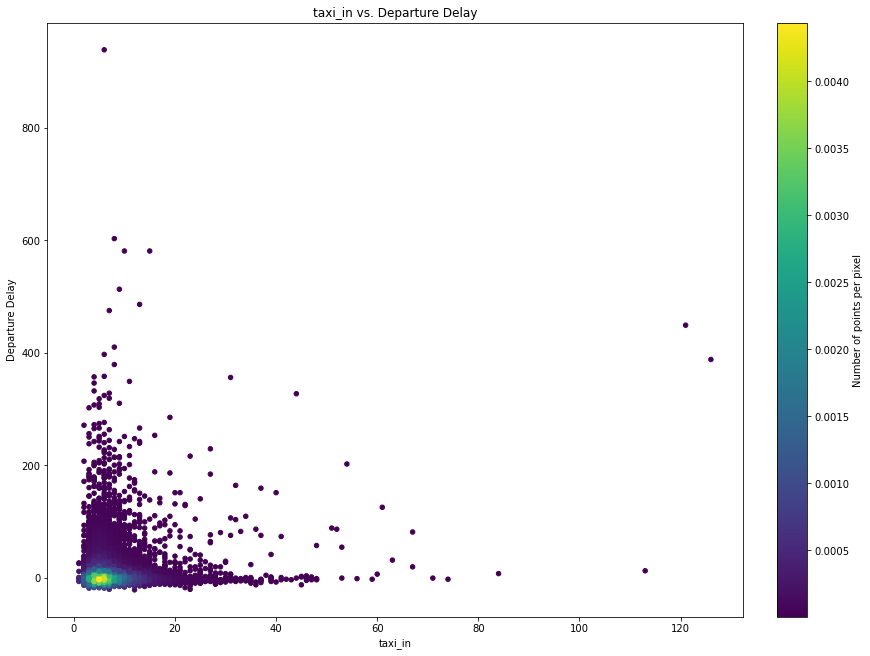

<Figure size 864x648 with 0 Axes>

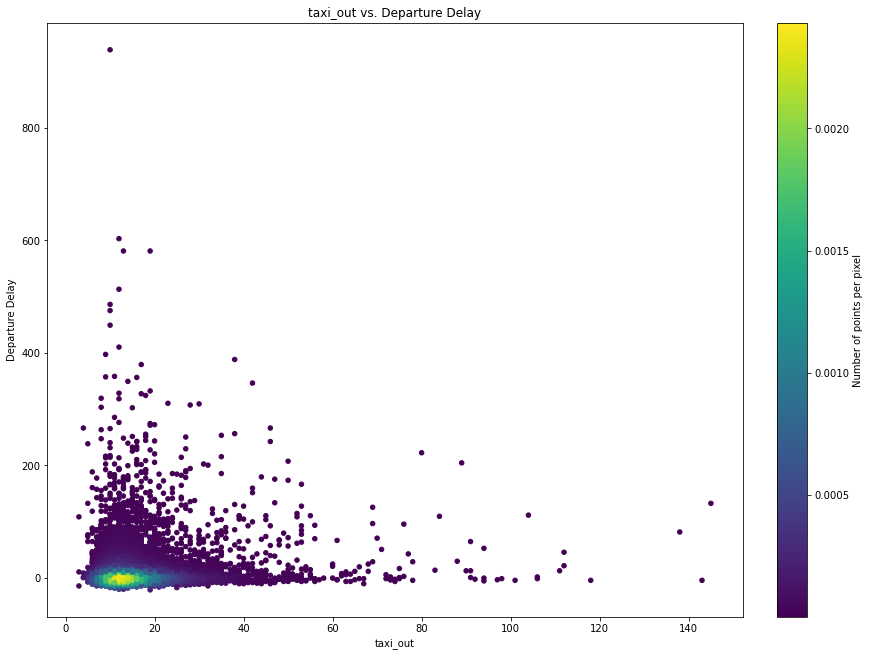

<Figure size 864x648 with 0 Axes>

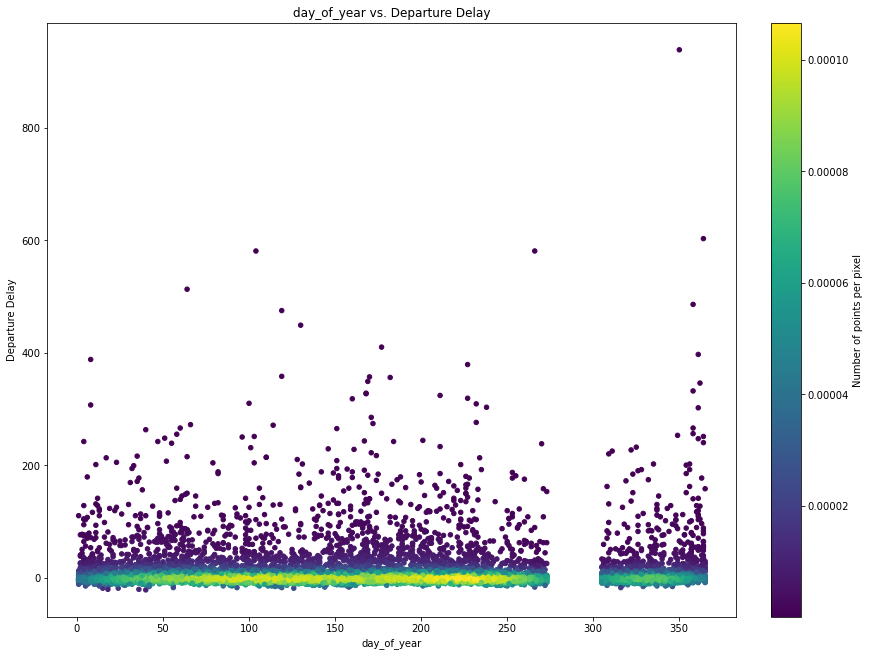

<Figure size 864x648 with 0 Axes>

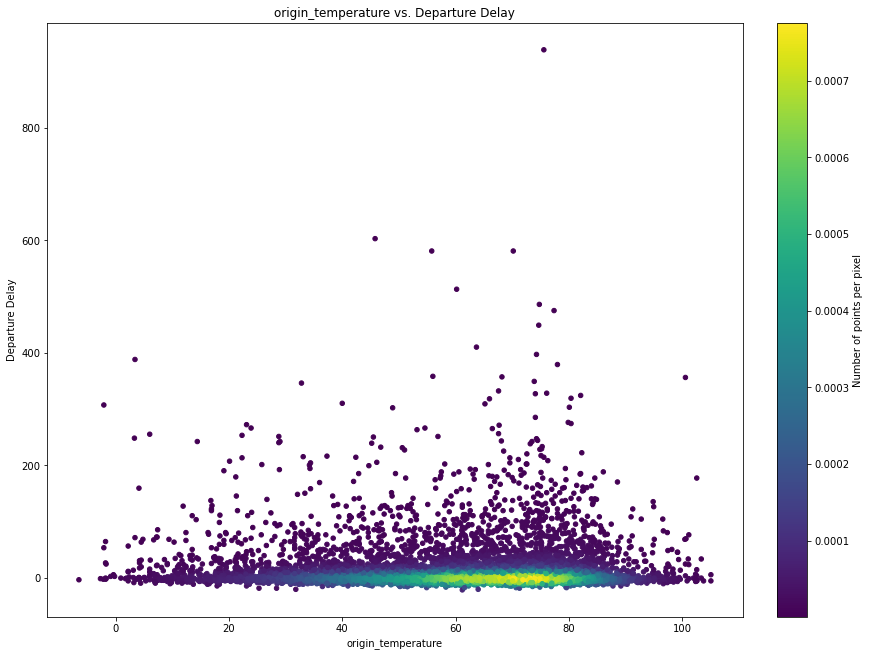

<Figure size 864x648 with 0 Axes>

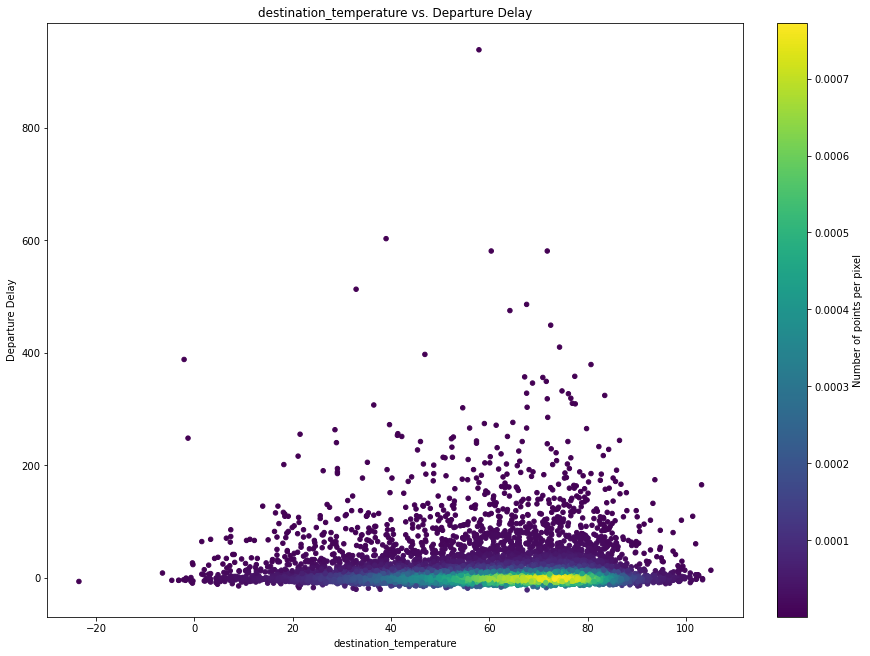

Non-Numeric Predictors, which were not included in the above plots, are:  ['airline', 'destination_airport', 'origin_airport', 'state_destination', 'state_origin', 'airline', 'destination_airport', 'origin_airport', 'state_destination', 'state_origin']


In [32]:
from scipy.stats import gaussian_kde
for i in flights_sample1.columns:
    if (flights_sample1[str(i)].dtype == 'int64' or flights_sample1[str(i)].dtype == 'float64') and (str(i) != 'departure_delay') :
        plt.figure(figsize=(12,9), layout = 'constrained')
        x = flights_sample1[i]
        y = flights_sample1['departure_delay']
        
        # Calculate the point density
        xy = np.vstack([x,y])
        z = gaussian_kde(xy)(xy)
       
        #Plot Set-Up
        fig, ax = plt.subplots(figsize=(12,9), layout = 'constrained')
        density = ax.scatter(x, y, c=z, s=20)
        fig.colorbar(density, label='Number of points per pixel')
        plt.title(str(i) + ' vs. Departure Delay')
        plt.xlabel(str(i))
        plt.ylabel('Departure Delay')
        # Show/save figure as desired.
        plt.show()
    else:
        non_numeric_columns.append(str(i))
non_numeric_columns.remove('departure_delay')
print("Non-Numeric Predictors, which were not included in the above plots, are: ", non_numeric_columns)

#### Kernel Density Estimate (KDE) Plots of Continuous Predictors Against departure_delay

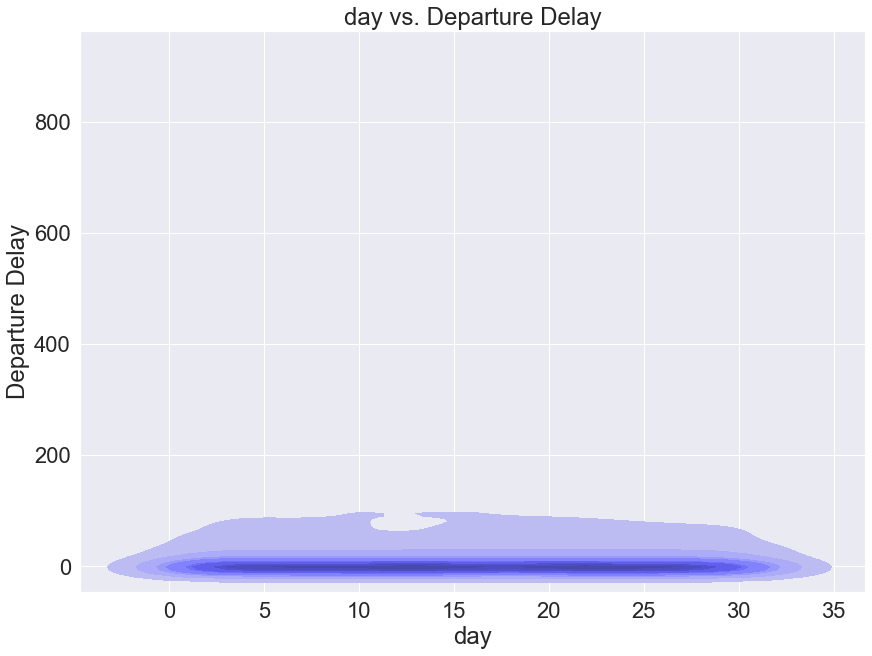

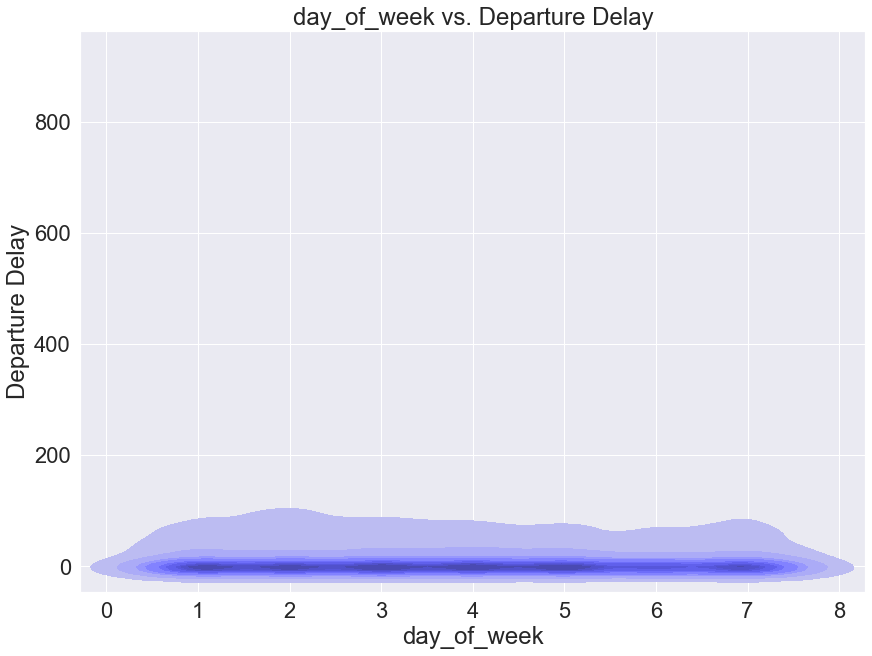

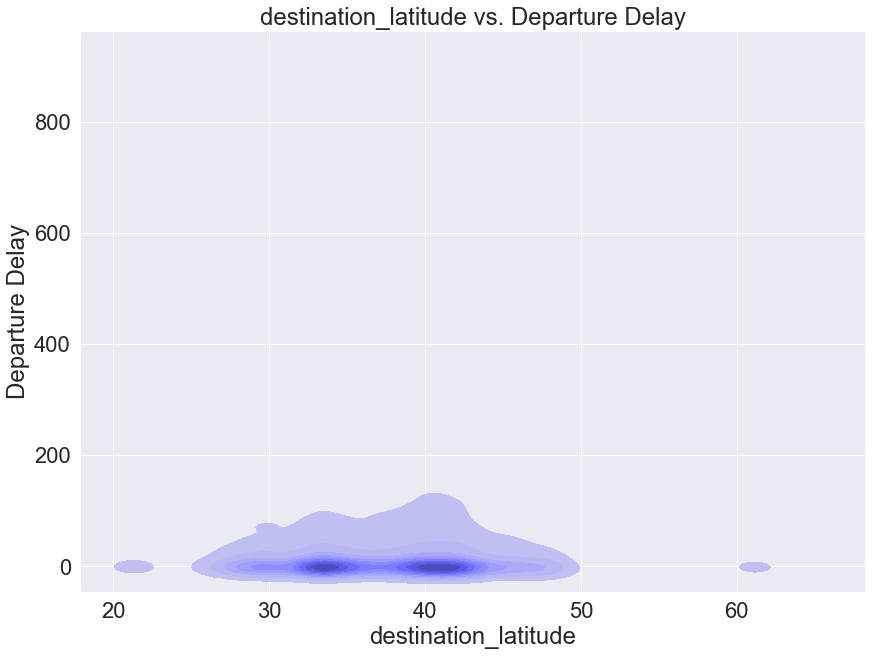

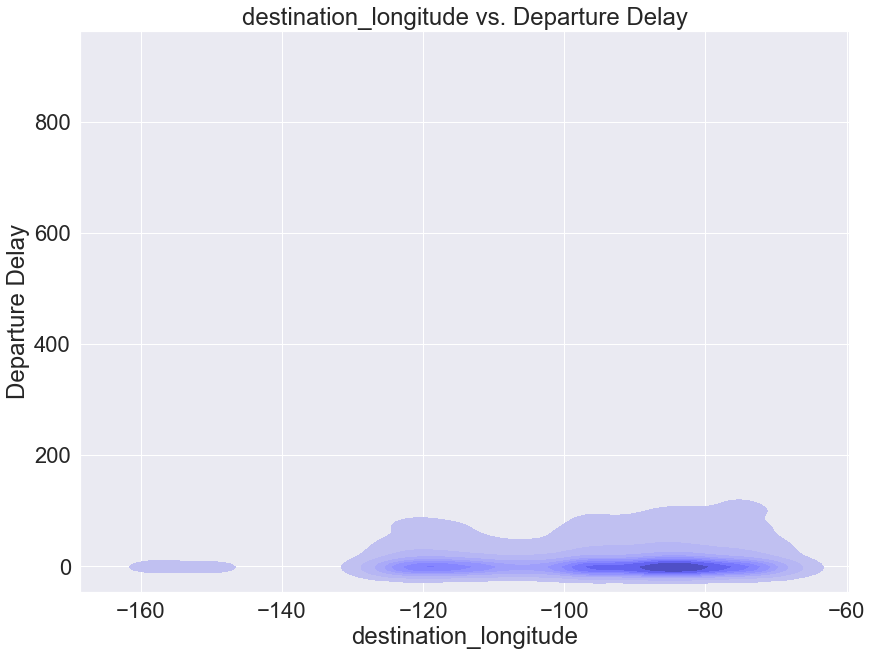

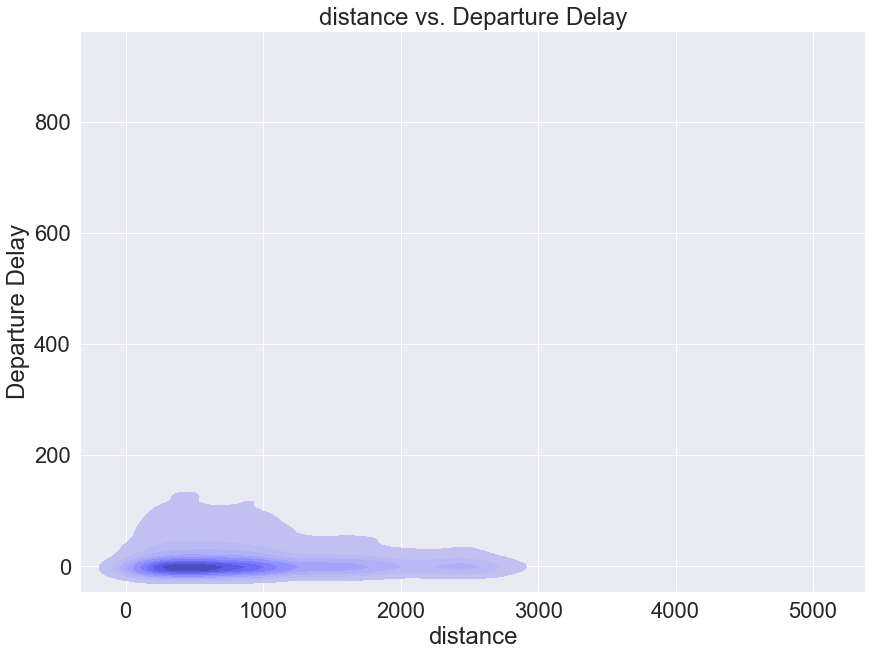

...

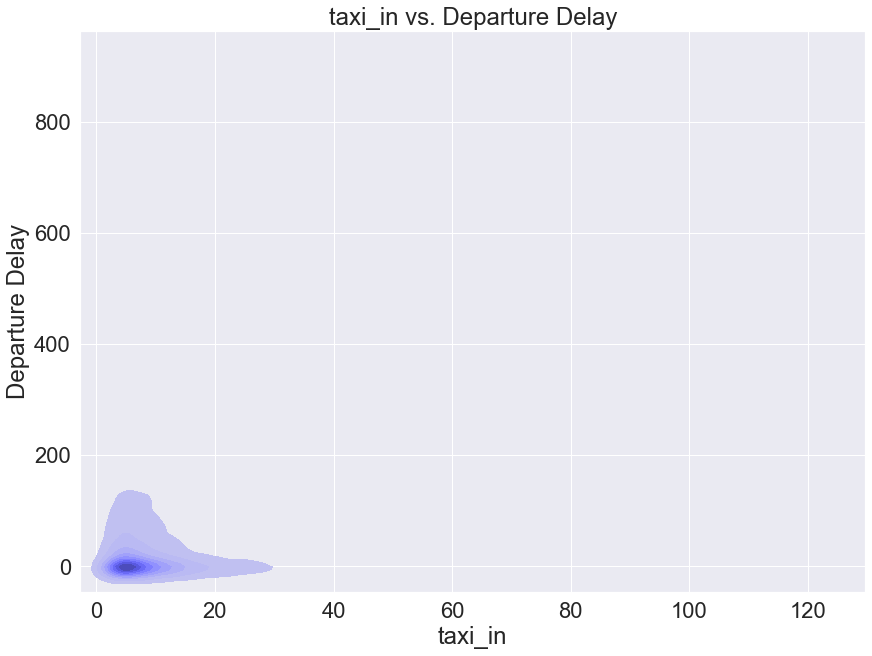

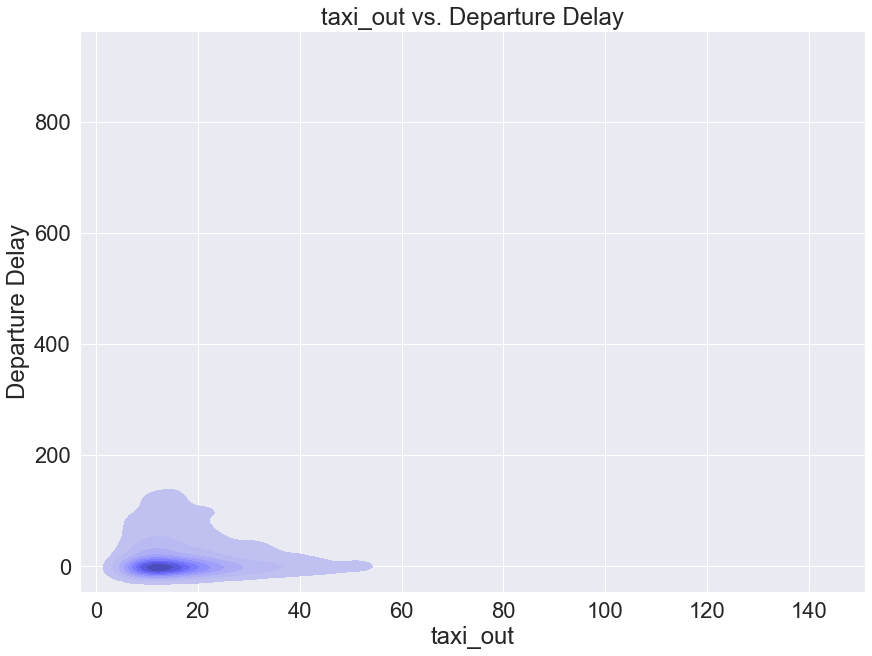

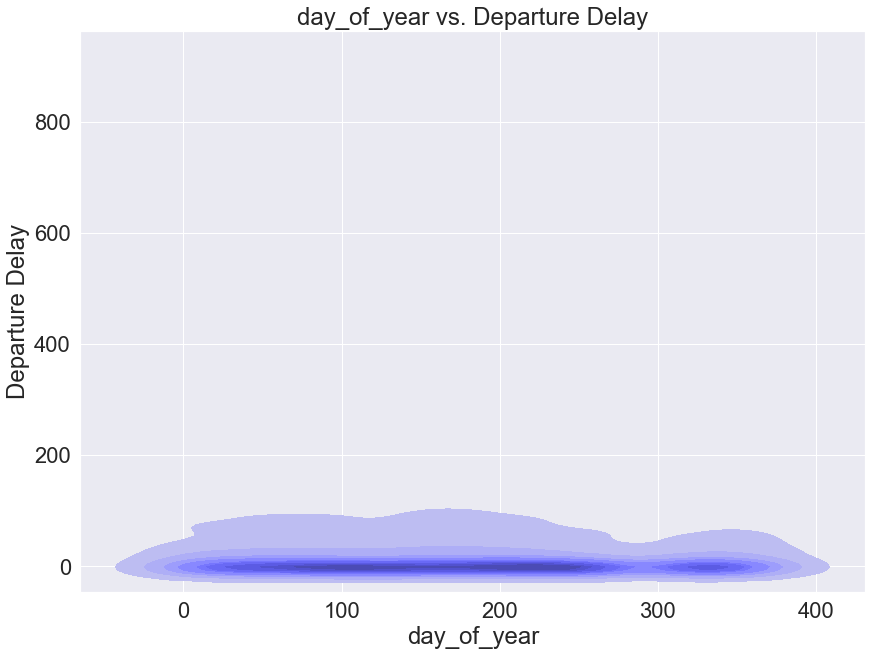

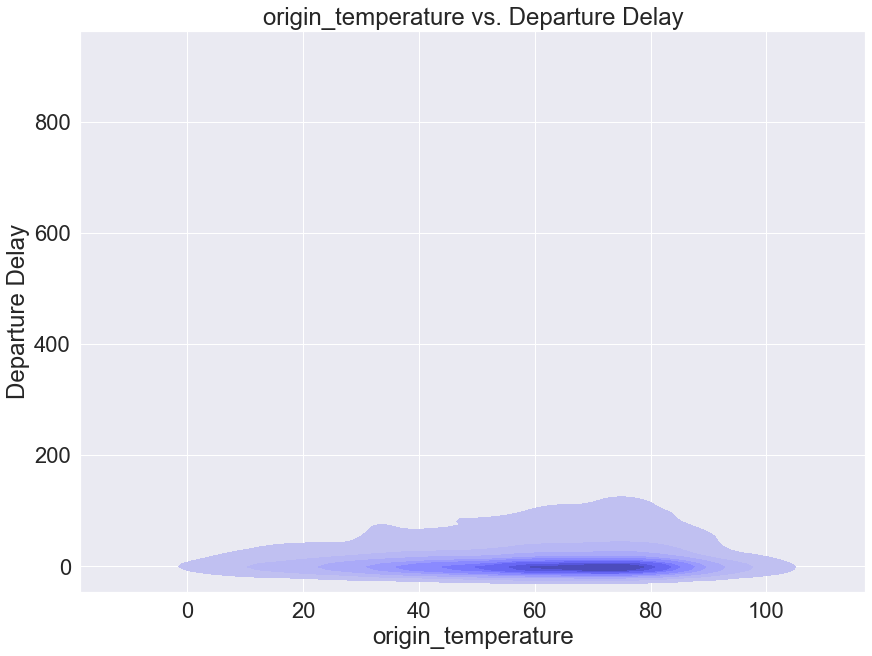

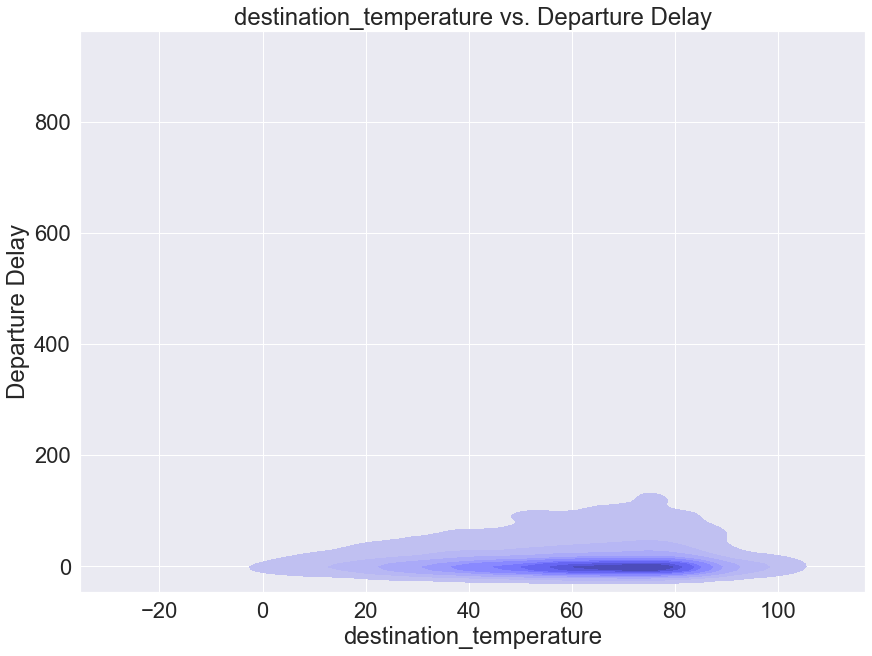

In [71]:
for i in flights_sample1.columns:
    if (flights_sample1[str(i)].dtype == 'int64' or flights_sample1[str(i)].dtype == 'float64') and (str(i) != 'departure_delay') :
       
        x = flights_sample1[i]
        y = flights_sample1['departure_delay']
       
        #Plot Set-Up
        fig, ax = plt.subplots(figsize=(12,9), layout = 'constrained')
        sns.kdeplot(x.values, y.values,color='blue',shade=True )
        plt.title(str(i) + ' vs. Departure Delay')
        plt.xlabel(str(i))
        plt.ylabel('Departure Delay')
        # Show/save figure as desired.
        plt.show()
    else:
        non_numeric_columns.append(str(i))
non_numeric_columns.remove('departure_delay')
#print("Non-Numeric Predictors, which were not included in the above plots, are: ", non_numeric_columns)

**EDA:** Based on the Gaussian and Non-Gaussian Kernel Density Estimate Plots of the continuous predictors against departure_delay, it does not seem like a partition, or binning, of some defined-width would be necessary. It does indicate that there is a high degree of concentration of localized-points within certain sections where there seems to be a non-linear trend (i.e. logarithmic trend) which is deceiving; the aforementioned concentration might cause the regression trend to lean towards becoming more linear and closer to it than manifesting a non-linear trend as one would think from just looking at a non-(G)KDE plot. 

#### Distribution of Categorical Variables Against departure_delay (Response Variable)

In [33]:
### Remove those whose mean is less than the overall mean or 125% of the overall mean and then plot the distributions

In [34]:
non_numeric_columns

['airline',
 'destination_airport',
 'origin_airport',
 'state_destination',
 'state_origin',
 'airline',
 'destination_airport',
 'origin_airport',
 'state_destination',
 'state_origin']

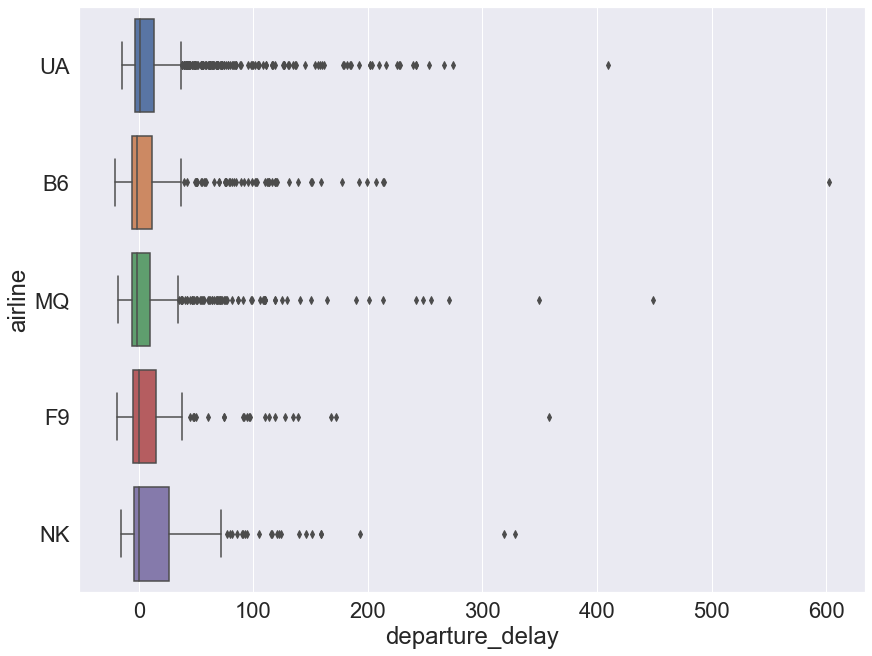

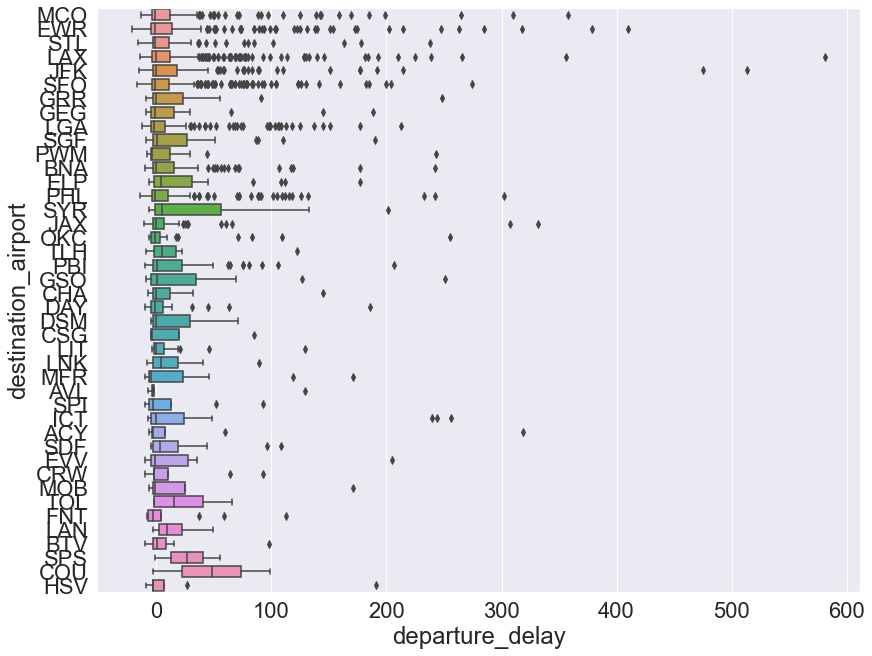

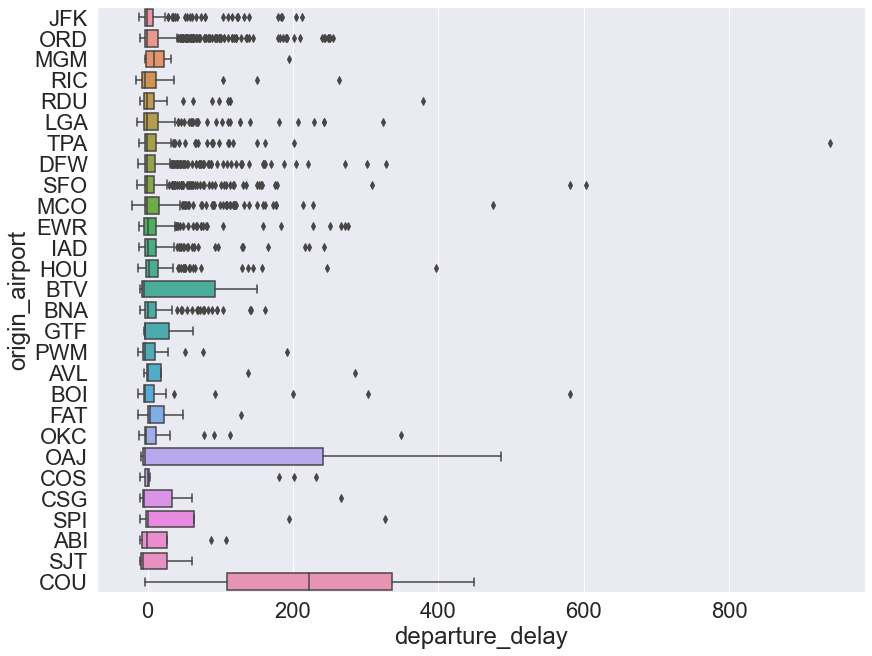

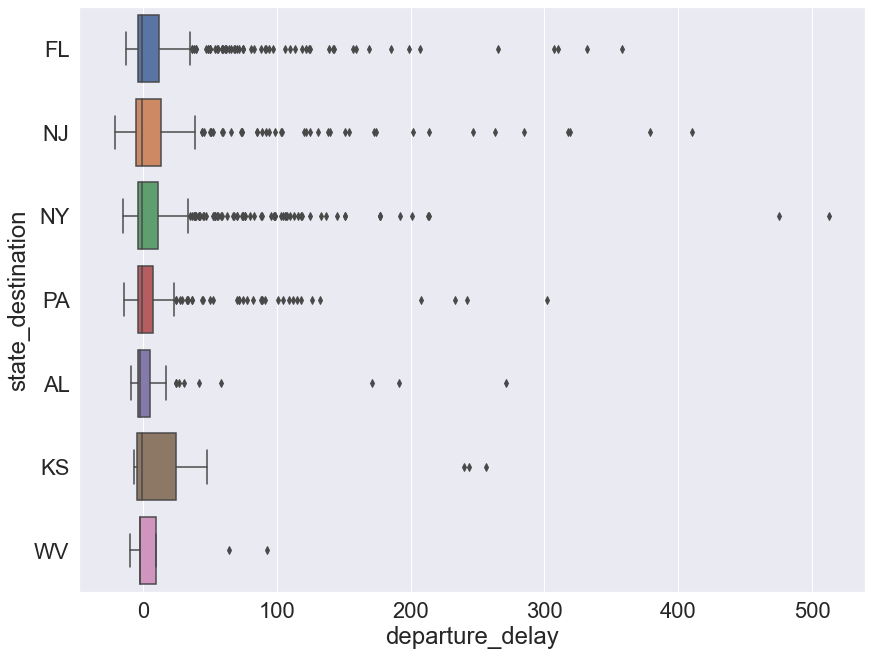

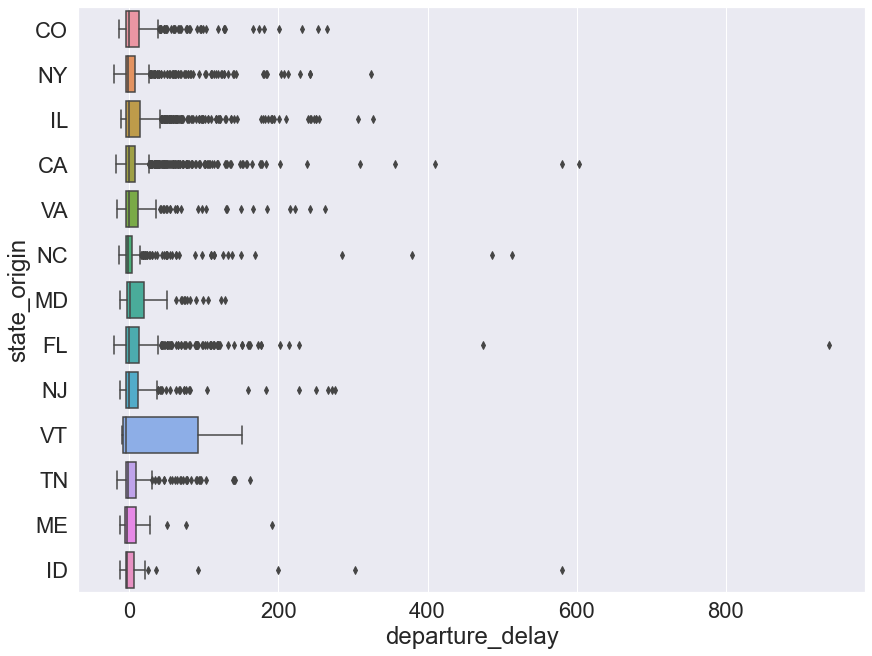

In [45]:
for i in flights_sample1.columns:
    if non_numeric_columns.count(str(i)) > 0 and str(i) != 'departure_delay' :
        k = flights_sample1.groupby([str(i)]).mean()['departure_delay'].mean()
        j = flights_sample1.groupby([str(i)]).mean()['departure_delay'] 
        pot_sig_var = j[j>1.25*k].index.to_list()
        mod_data = flights_sample1.loc[flights_sample1[str(i)].isin(pot_sig_var)]

        plt.figure(figsize=(12,9), layout = 'constrained')
        sns.boxplot(y = mod_data[str(i)], x = mod_data['departure_delay'])
        plt.show()


#### Frequency Distribution of Predictors

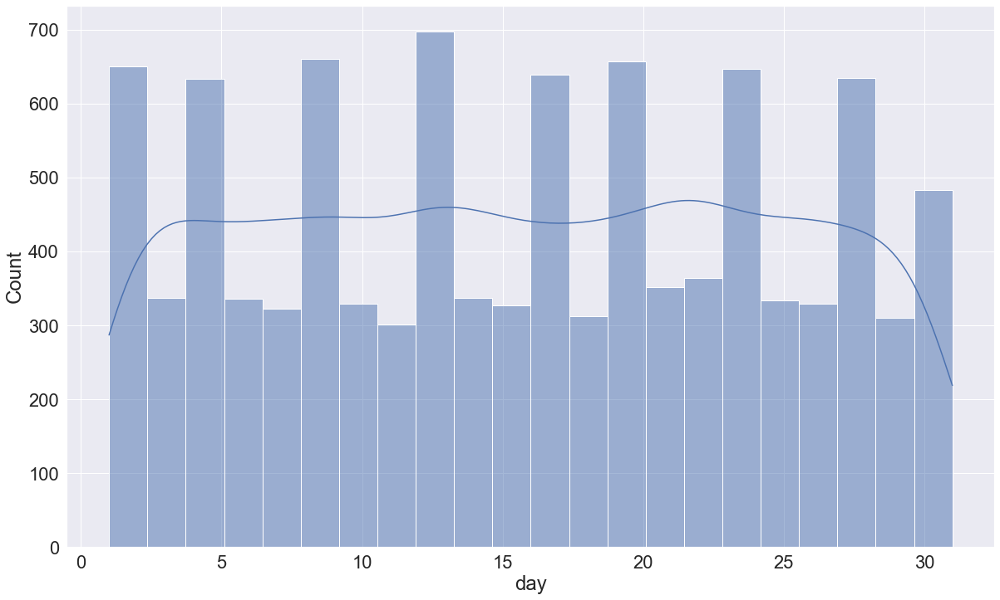

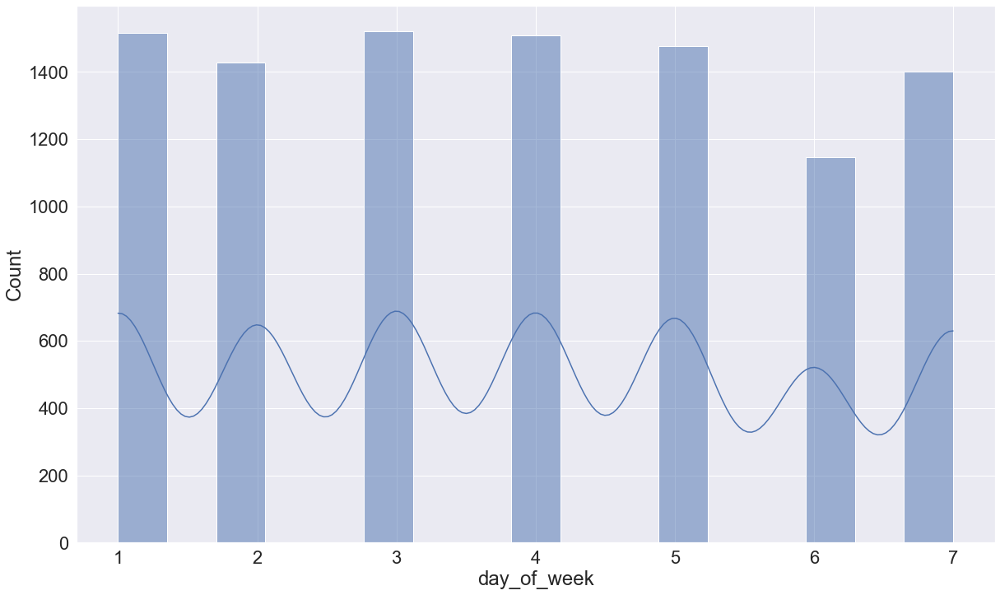

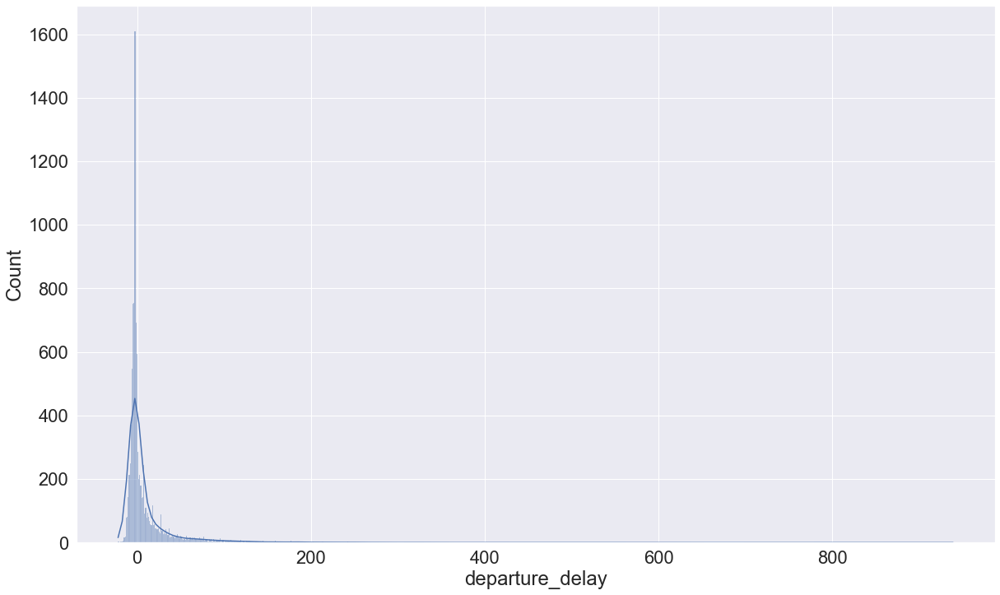

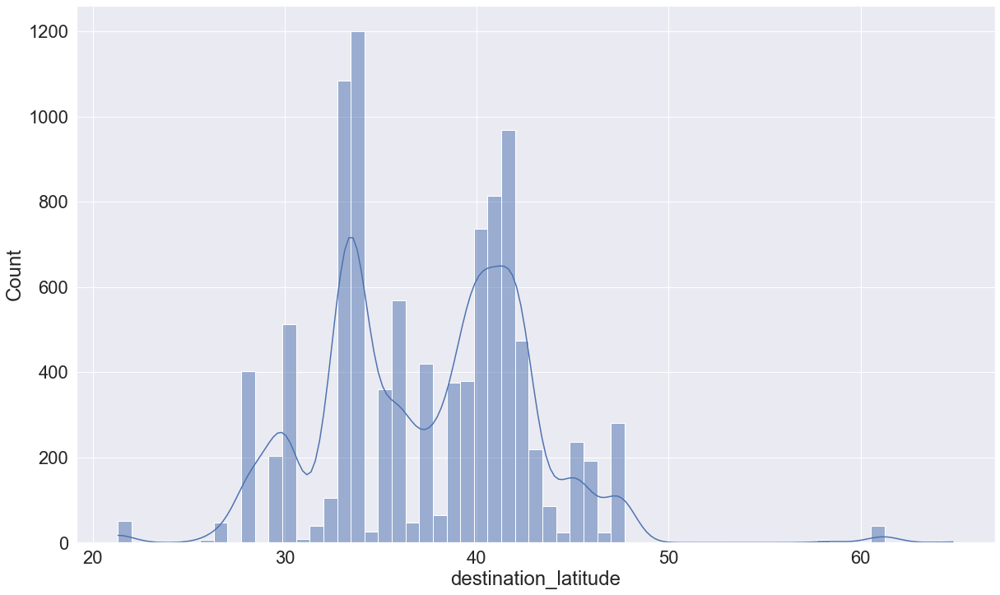

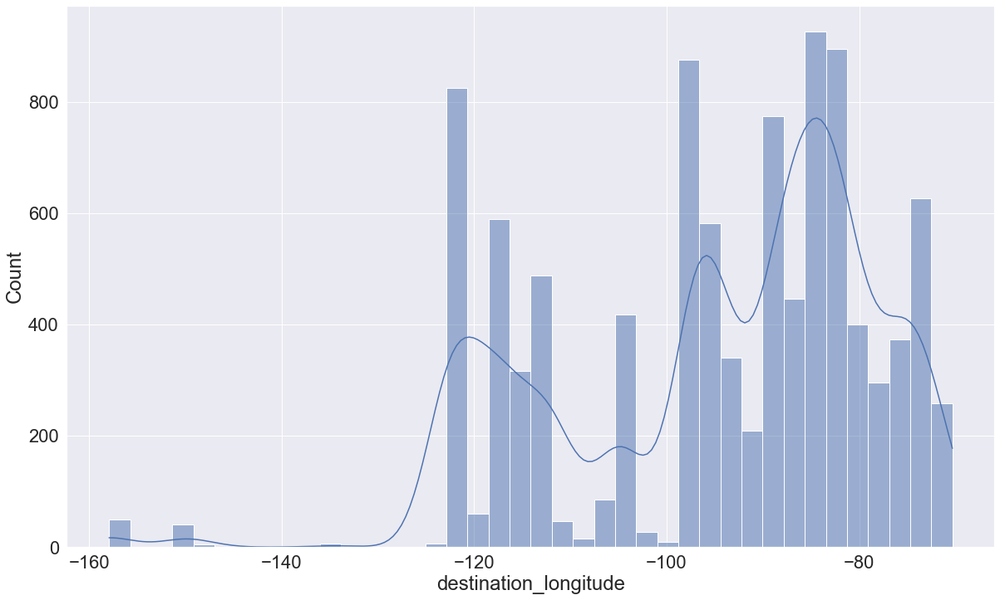

...

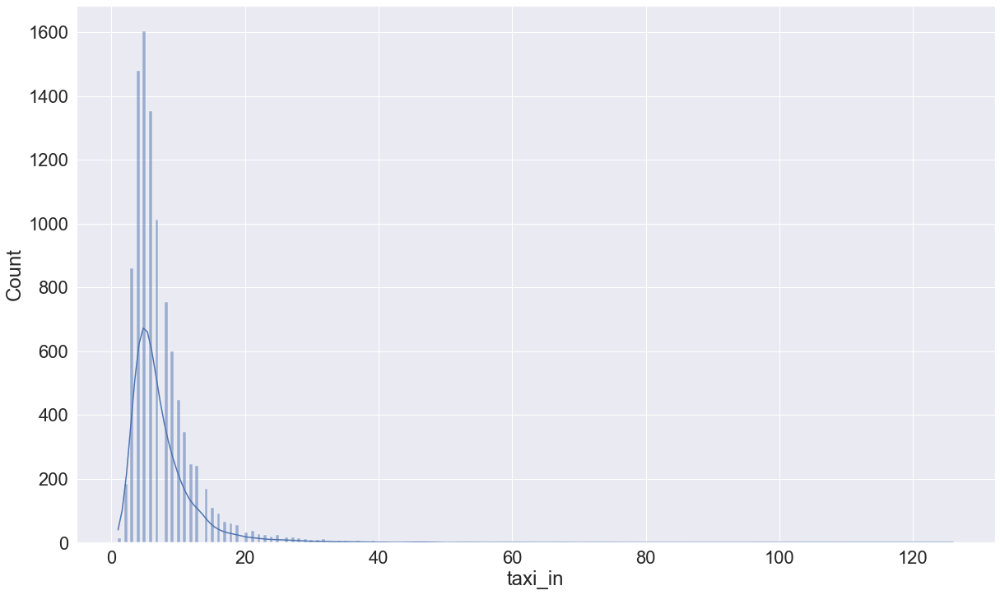

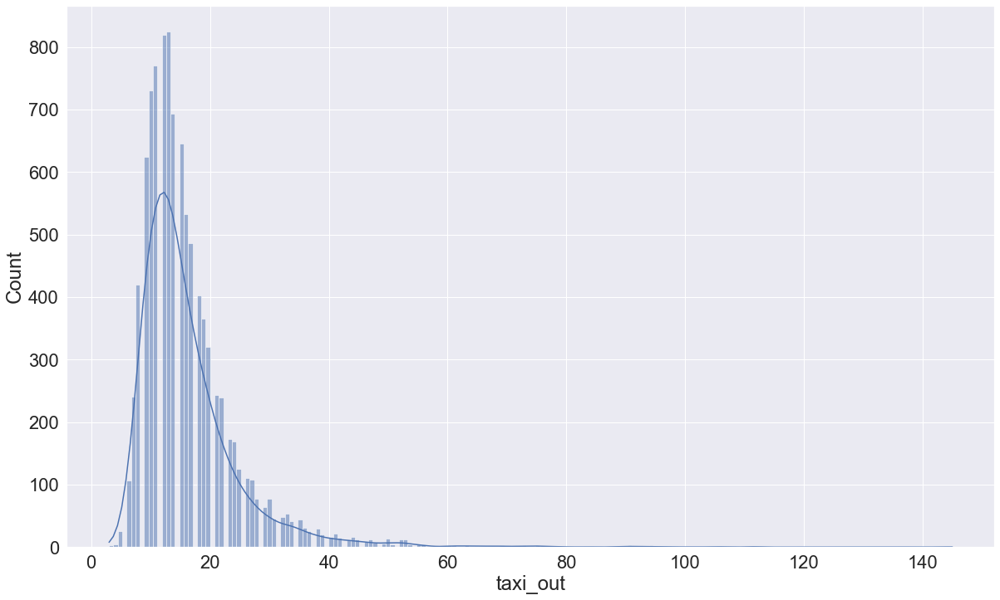

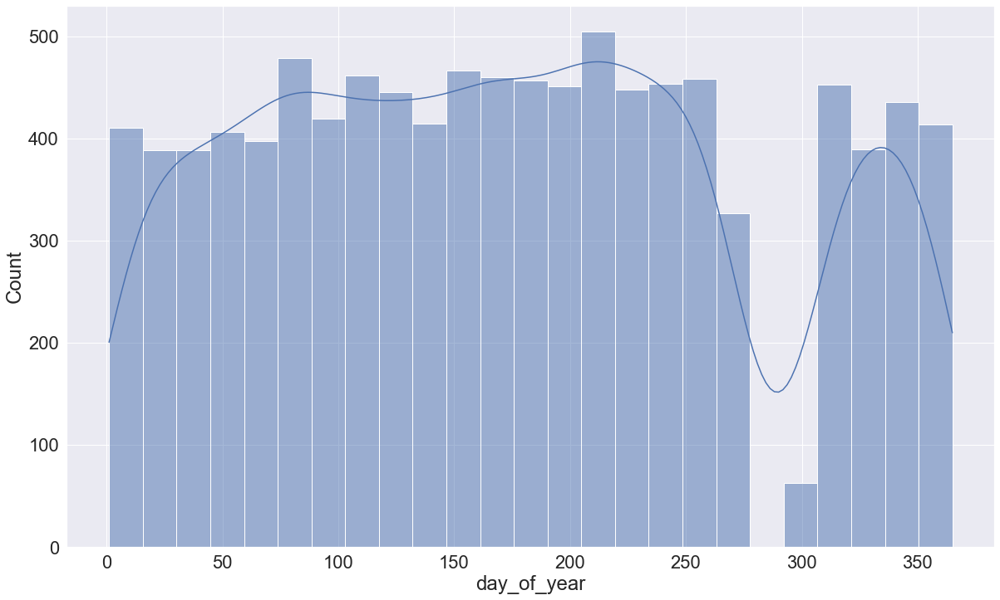

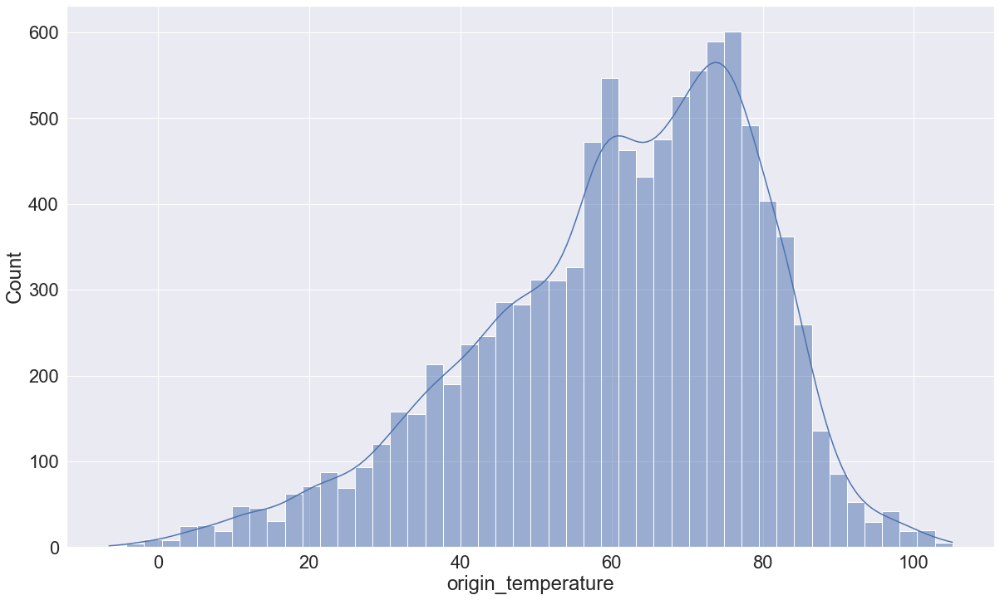

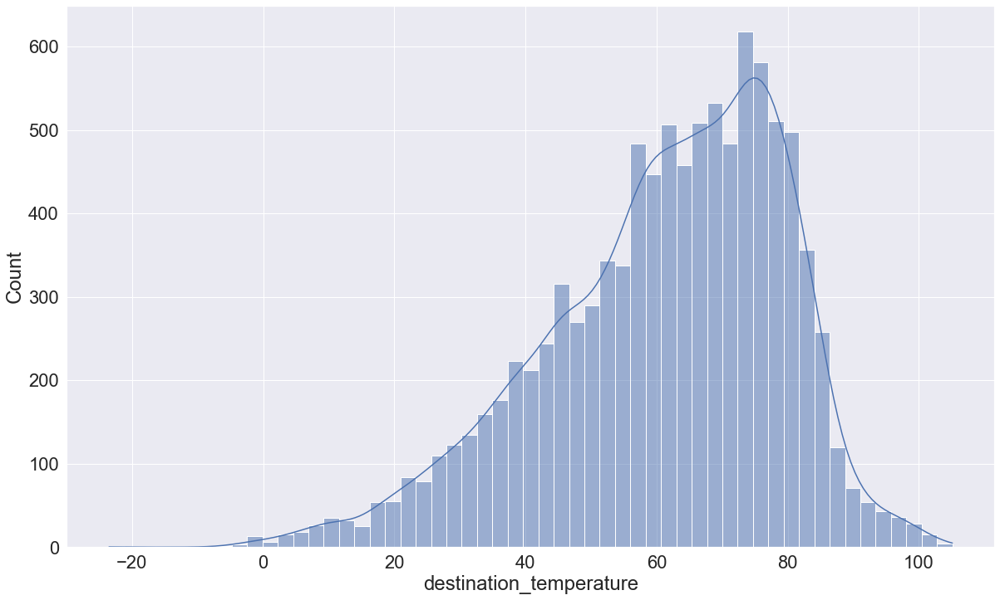

In [38]:
#Jittering points to better see the density of points in any given region of the plot
def jitter(values,j):
    return values + np.random.normal(j,0.02,values.shape)

for i in flights_sample1.columns:
    if (flights_sample1[str(i)].dtype == 'int64' or flights_sample1[str(i)].dtype == 'float64'):
        sns.set(rc = {'figure.figsize':(20,12)})
        sns.set(font_scale = 2)
        sns.histplot(flights_sample1[str(i)],kde=True)
        plt.show()

# Machine learning Methods

## Autocorreleation

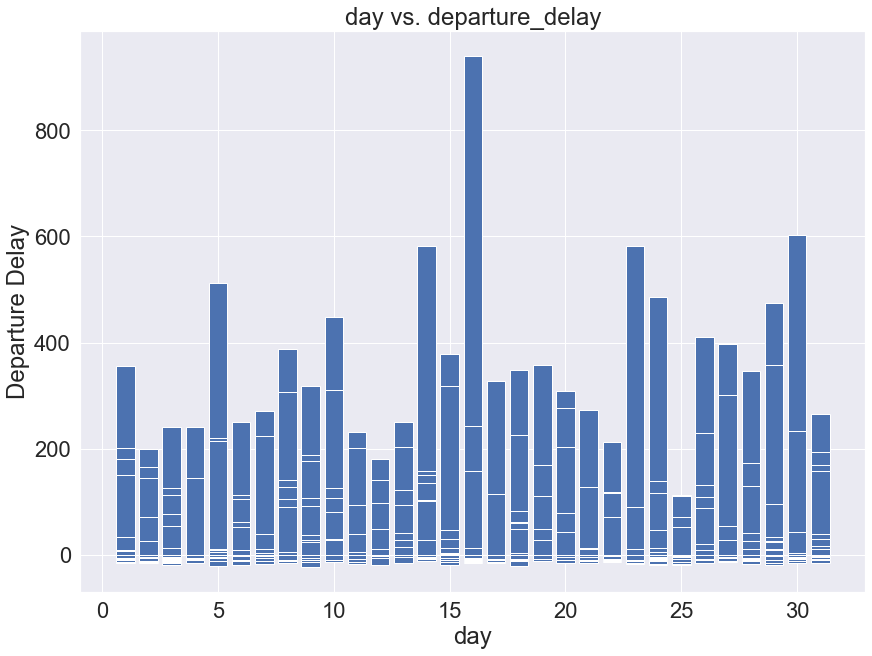

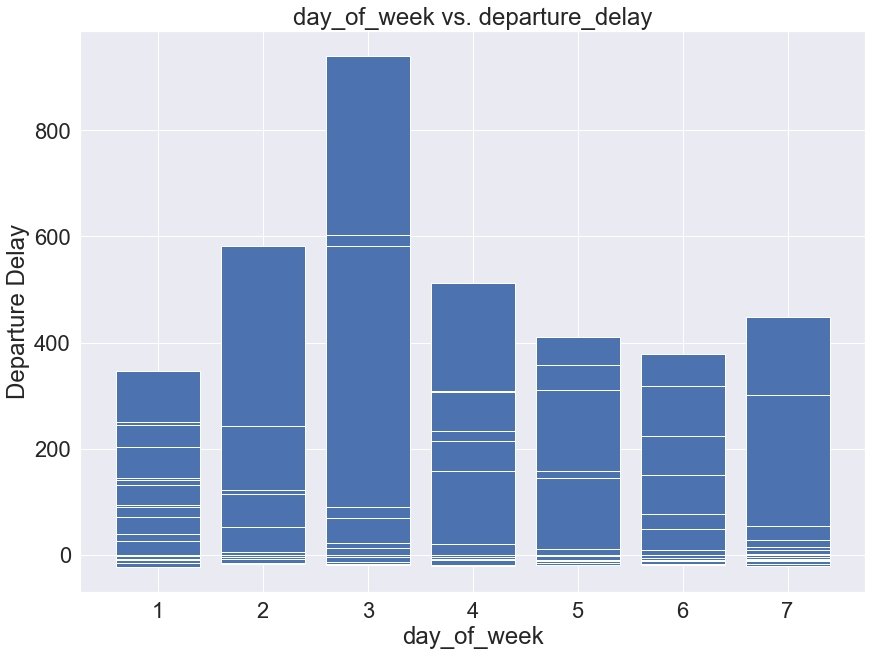

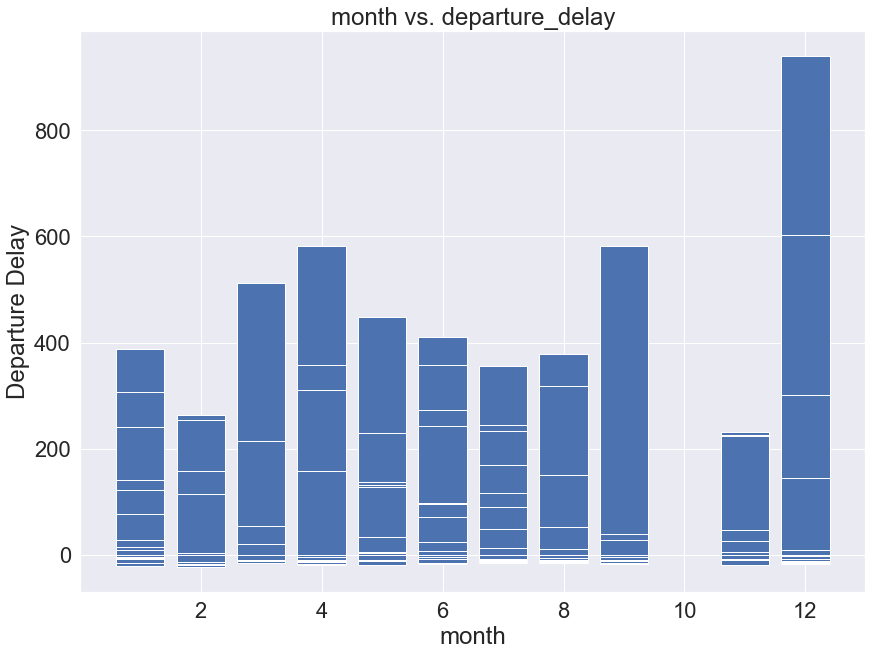

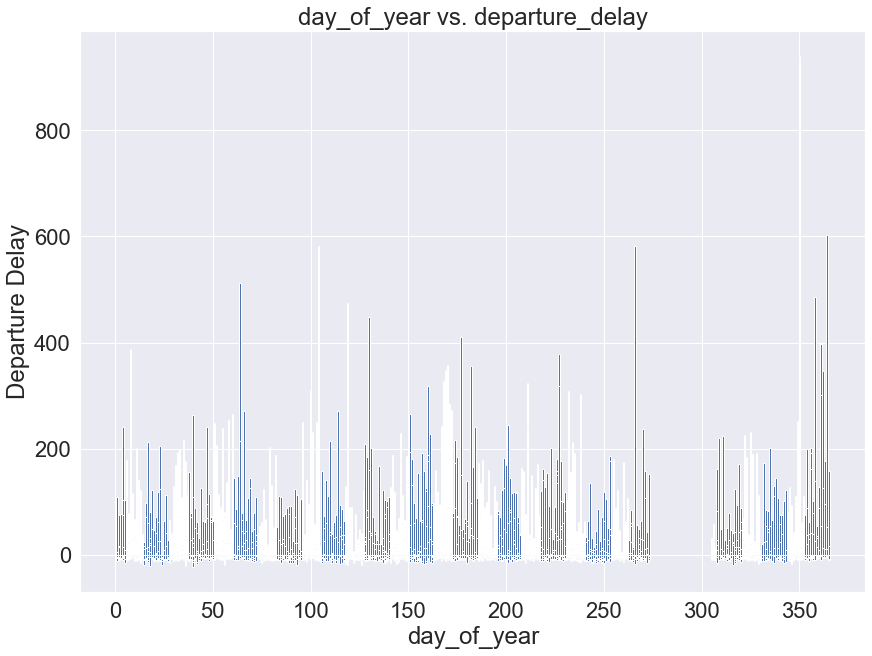

In [280]:
time_vars = ['day_of_year','month','day','day_of_week']
 flights_sample1[flights_sample1.columns.difference(['month','day','day_of_week'])].
    sort_values(by=['day_of_year']).groupby(['day_of_year']).mean().reset_index()
for i in flights_sample1.columns:
    if (flights_sample1[str(i)].dtype == 'int64' or flights_sample1[str(i)].dtype == 'float64') and (str(i) in time_vars) :
        plt.figure(figsize=(12,9), layout = 'constrained')
        plt.bar(flights_sample1[str(i)], flights_sample1['departure_delay'])
        plt.title(str(i) + ' vs. departure_delay')
        plt.xlabel(str(i))
        plt.ylabel('Departure Delay')
        # Show/save figure as desired.
        plt.show()
    else:
        continue

In [158]:
# Create new DataFrame that includes the mean of all the continuous variables with respect to each day of the year 
# so that we only have unique values for day_of_year and to make any possible autocorreleation implementation much 
# more feasible, or at least less computationally intensive.
departure_v_doy = flights_sample1[flights_sample1.columns.difference(['month','day','day_of_week'])].sort_values(by=['day_of_year']).groupby(['day_of_year']).mean().reset_index()
departure_v_doy

,day_of_year,departure_delay,destination_latitude,destination_longitude,destination_temperature,distance,origin_latitude,origin_longitude,origin_temperature,scheduled_arrival,scheduled_departure,scheduled_time,taxi_in,taxi_out
0,1,1.892857,38.472717,-95.937151,32.914286,911.464286,37.161049,-99.798200,37.800000,934.321429,776.785714,151.107143,7.357143,15.678571
1,2,7.875000,38.397717,-95.154231,37.575000,966.687500,37.010775,-97.737403,37.690625,873.750000,789.562500,157.312500,5.875000,16.500000
2,3,9.125000,38.001283,-94.909585,40.250000,977.875000,38.459807,-93.365239,39.029167,986.291667,828.833333,162.458333,8.583333,18.583333
3,4,31.638889,36.686990,-93.470113,45.258333,797.583333,38.347087,-92.885424,38.555556,869.777778,808.500000,139.611111,7.888889,20.000000
4,5,12.115385,37.977999,-99.856579,35.930769,770.307692,38.638115,-97.213650,29.219231,851.038462,719.615385,136.038462,7.807692,16.615385
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
329,361,60.333333,37.292062,-93.319104,50.116667,783.366667,36.204224,-97.888480,49.643333,779.633333,774.033333,133.600000,8.466667,16.833333
330,362,39.187500,37.134952,-102.710209,45.550000,794.062500,35.244215,-95.595782,42.956250,803.937500,775.750000,144.437500,6.437500,17.750000
331,363,22.416667,35.968414,-99.577167,42.470833,872.833333,38.170065,-94.020704,40.120833,855.000000,718.625000,156.375000,7.166667,19.458333
332,364,45.522727,36.432324,-94.800237,43.793182,1048.636364,37.416395,-95.699679,45.343182,857.818182,719.840909,170.704545,9.227273,16.045455


Text(0, 0.5, 'departure_delay')

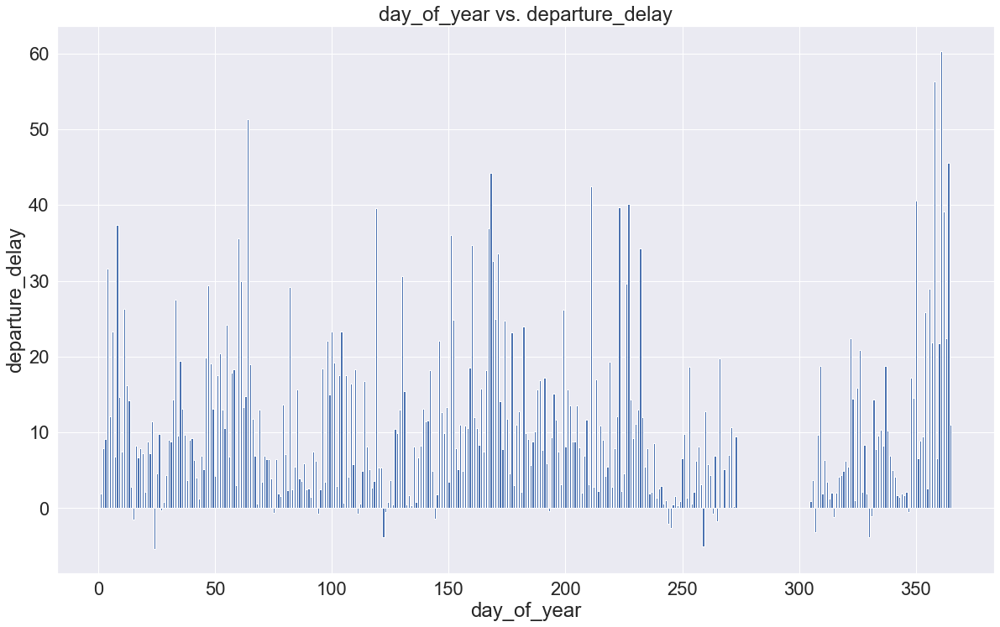

In [166]:
plt.bar(departure_v_doy['day_of_year'], departure_v_doy['departure_delay'])
plt.title('day_of_year' + ' vs. departure_delay')
plt.xlabel('day_of_year')
plt.ylabel('departure_delay')

In [263]:
pred_var_doy = list(departure_v_doy.columns.difference(['departure_delay', 'day_of_year']))
res = build_model(pred_var_doy)
res

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        departure_delay   R-squared:                       0.248
Model:                            OLS   Adj. R-squared:                  0.219
Method:                 Least Squares   F-statistic:                     8.800
Date:                Mon, 13 Mar 2023   Prob (F-statistic):           1.49e-14
Time:                        01:00:51   Log-Likelihood:                -1215.1
No. Observations:                 334   AIC:                             2456.
Df Residuals:                     321   BIC:                             2506.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      38.3746     34.739      1.105      0.270     -29.971     106.720
destination_latitude       -1.2344      0.650     -1.900      0.058      -2.513       0.044
destination_longitude      -0.3855      0.238     -1.616      0.107      -0.855       0.084
destination_temperature     0.2563      0.244      1.050      0.294      -0.224       0.737
distance                    0.0901      0.042      2.143      0.033       0.007       0.173
origin_latitude            -0.0595      0.629     -0.095      0.925      -1.298       1.178
origin_longitude            0.3649      0.309      1.182      0.238      -0.243       0.972
origin_temperature         -0.3059      0.242     -1.262      0.208      -0.783       0.171
scheduled_arrival          -0.0170      0.012     -1.388      0.166      -0.041       0.007
scheduled_departure         0.0291      0.012      2.395      0.017       0.005       0.053
scheduled_time             -0.7431      0.341     -2.179      0.030      -1.414      -0.072
taxi_in                     1.2518      0.480      2.608      0.010       0.307       2.196
taxi_out                    2.1865      0.267      8.198      0.000       1.662       2.711
==============================================================================
Omnibus:                       90.339   Durbin-Watson:                   1.715
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              212.935
Skew:                           1.323   Prob(JB):                     5.78e-47
Kurtosis:                       5.880   Cond. No.                     1.02e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.02e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

0      -4.261471
1      -1.764694
2      -7.055010
3       8.433505
4      -1.257082
         ...    
329    44.263815
330    25.522768
331     7.693074
332    34.741853
333    -1.526953
Length: 334, dtype: float64

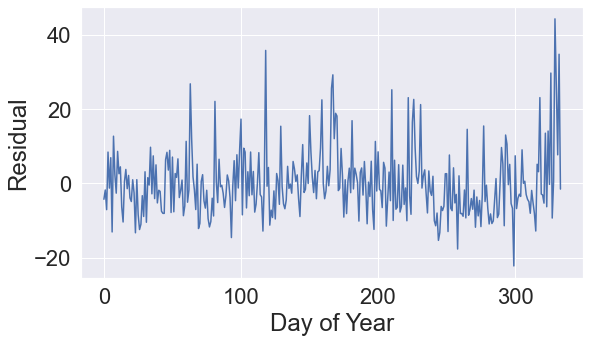

In [265]:
plt_residual(res)  

acf shows that there is a strong correlation for 24 lags, which is one day.


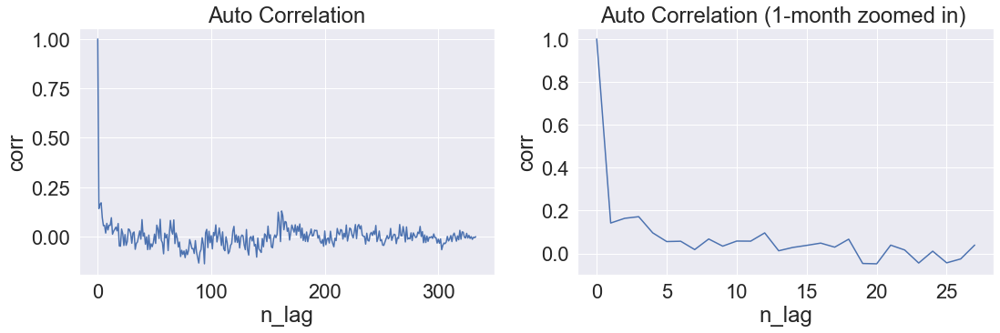

,0
day of year,
0,1.00
1,0.14
2,0.16
3,0.17
4,0.10
...,...
329,0.00
330,-0.01
331,-0.00


A maximum correlation of 0.17 could be realized with a corresponding time-lag of 4


In [272]:
print("acf shows that there is a strong correlation for 24 lags, which is one day.")
plt_acf(res)

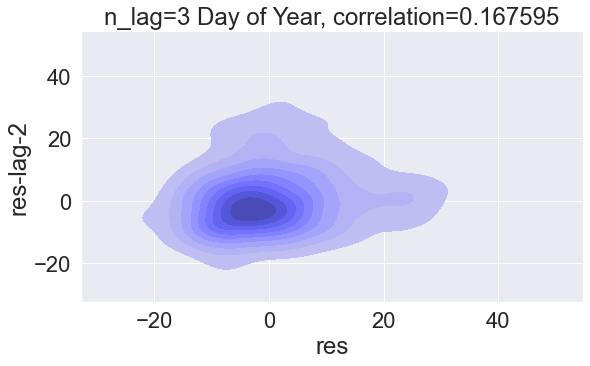

In [273]:
plt_residual_lag(res, 2)


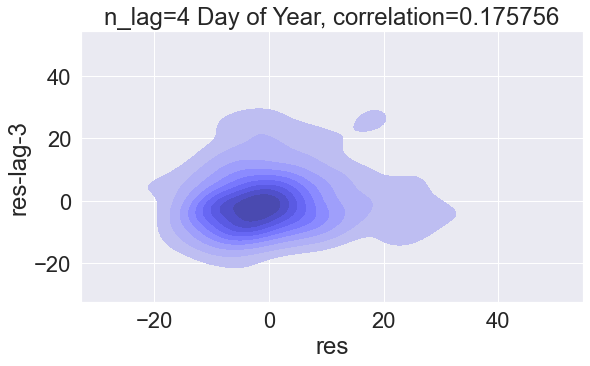

In [274]:
plt_residual_lag(res, 3)

In [278]:
departure_v_doy['departure_delay_4_days']=departure_v_doy['departure_delay'].shift(4)
departure_v_doy

,day_of_year,departure_delay,destination_latitude,destination_longitude,destination_temperature,distance,origin_latitude,origin_longitude,origin_temperature,scheduled_arrival,scheduled_departure,scheduled_time,taxi_in,taxi_out,departure_delay_4_days
0,1,1.892857,38.472717,-95.937151,32.914286,911.464286,37.161049,-99.798200,37.800000,934.321429,776.785714,151.107143,7.357143,15.678571,NaN
1,2,7.875000,38.397717,-95.154231,37.575000,966.687500,37.010775,-97.737403,37.690625,873.750000,789.562500,157.312500,5.875000,16.500000,NaN
2,3,9.125000,38.001283,-94.909585,40.250000,977.875000,38.459807,-93.365239,39.029167,986.291667,828.833333,162.458333,8.583333,18.583333,NaN
3,4,31.638889,36.686990,-93.470113,45.258333,797.583333,38.347087,-92.885424,38.555556,869.777778,808.500000,139.611111,7.888889,20.000000,NaN
4,5,12.115385,37.977999,-99.856579,35.930769,770.307692,38.638115,-97.213650,29.219231,851.038462,719.615385,136.038462,7.807692,16.615385,1.892857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
329,361,60.333333,37.292062,-93.319104,50.116667,783.366667,36.204224,-97.888480,49.643333,779.633333,774.033333,133.600000,8.466667,16.833333,21.878049
330,362,39.187500,37.134952,-102.710209,45.550000,794.062500,35.244215,-95.595782,42.956250,803.937500,775.750000,144.437500,6.437500,17.750000,56.310345
331,363,22.416667,35.968414,-99.577167,42.470833,872.833333,38.170065,-94.020704,40.120833,855.000000,718.625000,156.375000,7.166667,19.458333,6.608696
332,364,45.522727,36.432324,-94.800237,43.793182,1048.636364,37.416395,-95.699679,45.343182,857.818182,719.840909,170.704545,9.227273,16.045455,21.727273


In [286]:
pred_var_doy = list(departure_v_doy.columns.difference(['departure_delay', 'day_of_year','origin_temperature','scheduled_arrival','origin_longitude','origin_latitude','destination_temperature','destination_longitude','scheduled_time','distance']))
res2=build_model(pred_var_doy)
res2

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        departure_delay   R-squared:                       0.267
Model:                            OLS   Adj. R-squared:                  0.255
Method:                 Least Squares   F-statistic:                     23.55
Date:                Mon, 13 Mar 2023   Prob (F-statistic):           3.45e-20
Time:                        16:08:55   Log-Likelihood:                -1196.0
No. Observations:                 330   AIC:                             2404.
Df Residuals:                     324   BIC:                             2427.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      3.4904     19.049      0.183      0.855     -33.985      40.966
departure_delay_4_days     0.2235      0.049      4.533      0.000       0.126       0.320
destination_latitude      -1.3763      0.476     -2.893      0.004      -2.312      -0.440
scheduled_departure        0.0214      0.008      2.526      0.012       0.005       0.038
taxi_in                    0.9052      0.451      2.007      0.046       0.018       1.793
taxi_out                   1.9594      0.247      7.921      0.000       1.473       2.446
==============================================================================
Omnibus:                       94.045   Durbin-Watson:                   1.840
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              238.953
Skew:                           1.356   Prob(JB):                     1.29e-52
Kurtosis:                       6.165   Cond. No.                     3.07e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.07e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

0            NaN
1            NaN
2            NaN
3            NaN
4       5.452789
         ...    
329    46.072420
330    17.019096
331     6.965256
332    32.126956
333   -11.992330
Length: 334, dtype: float64

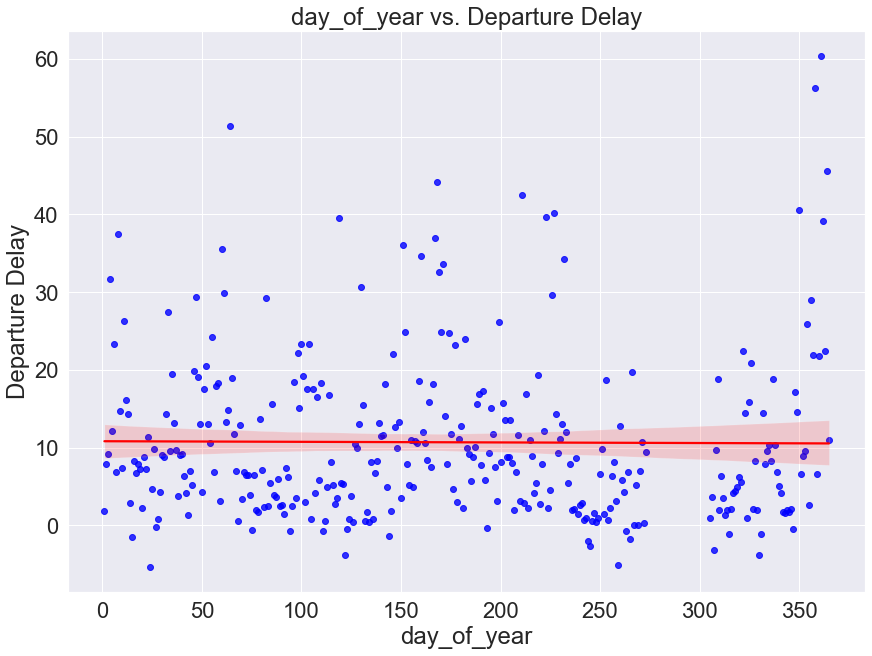

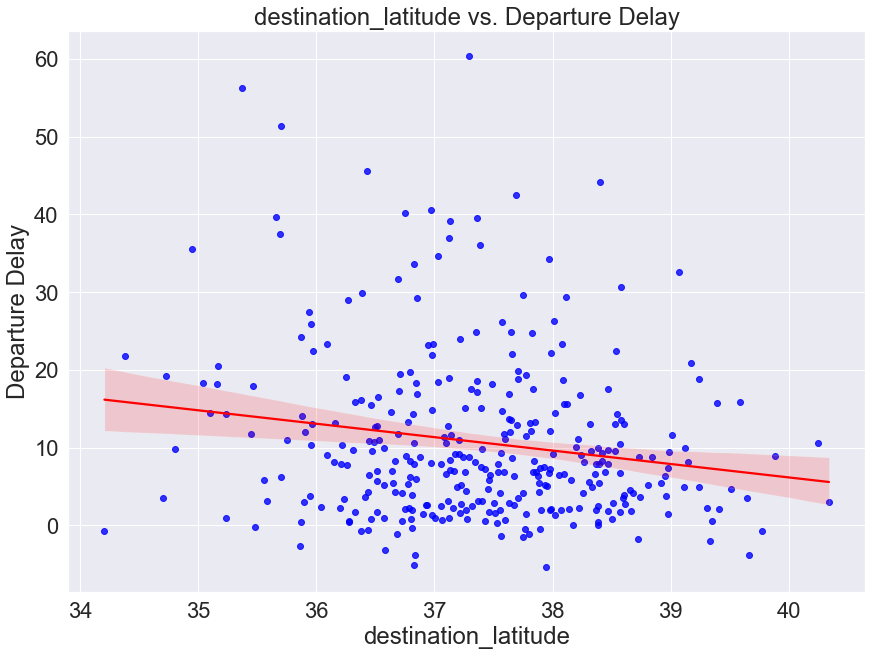

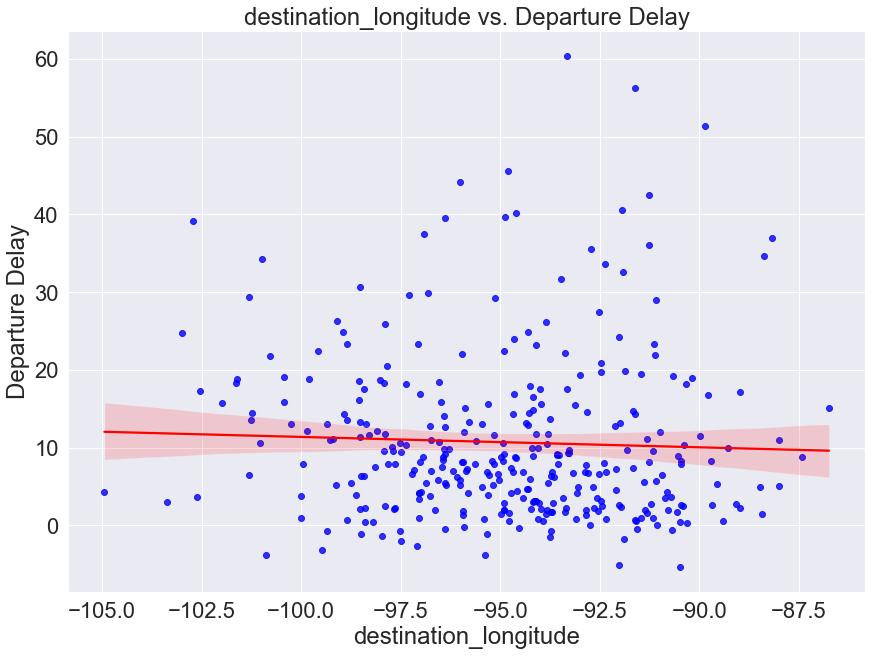

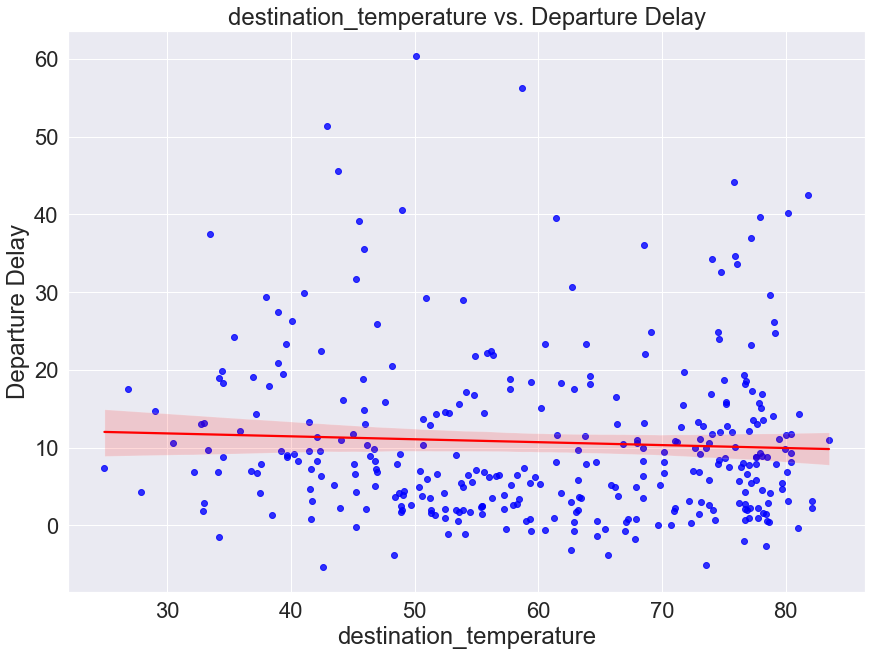

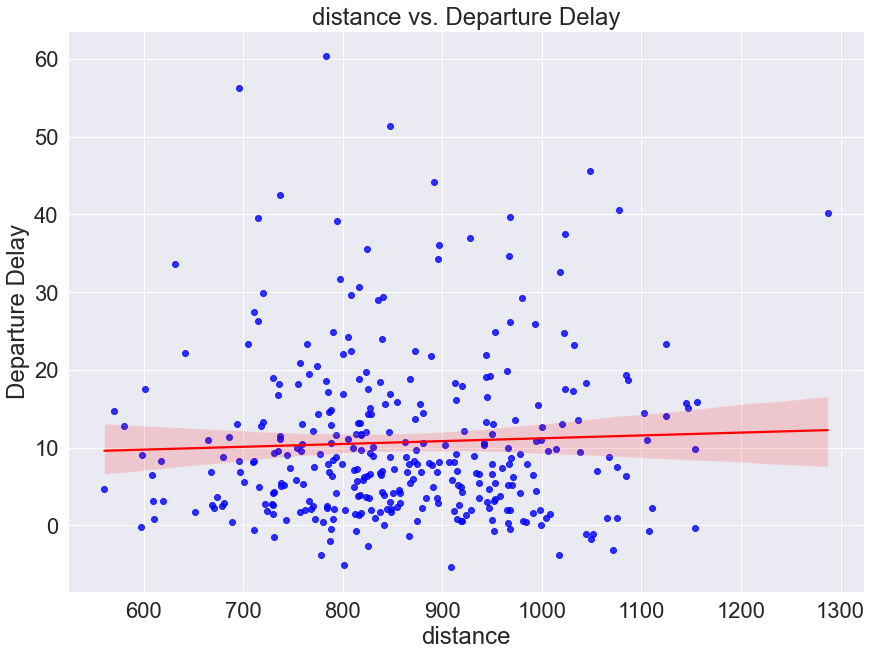

...

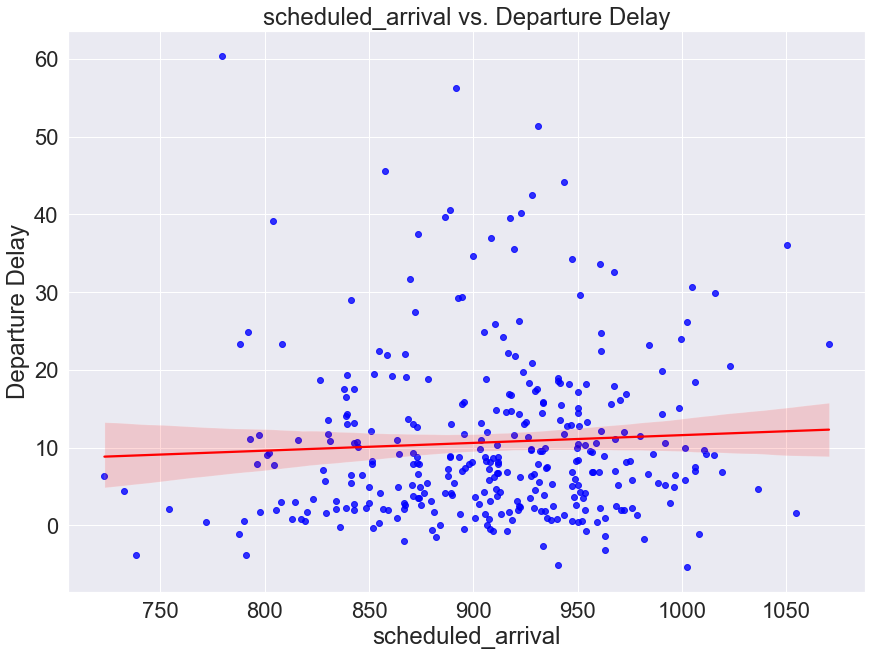

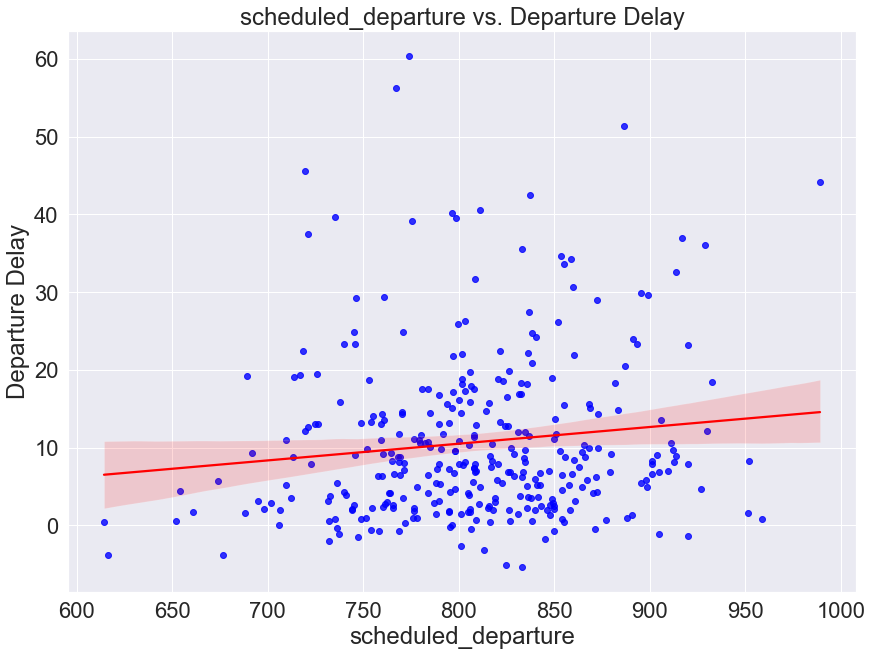

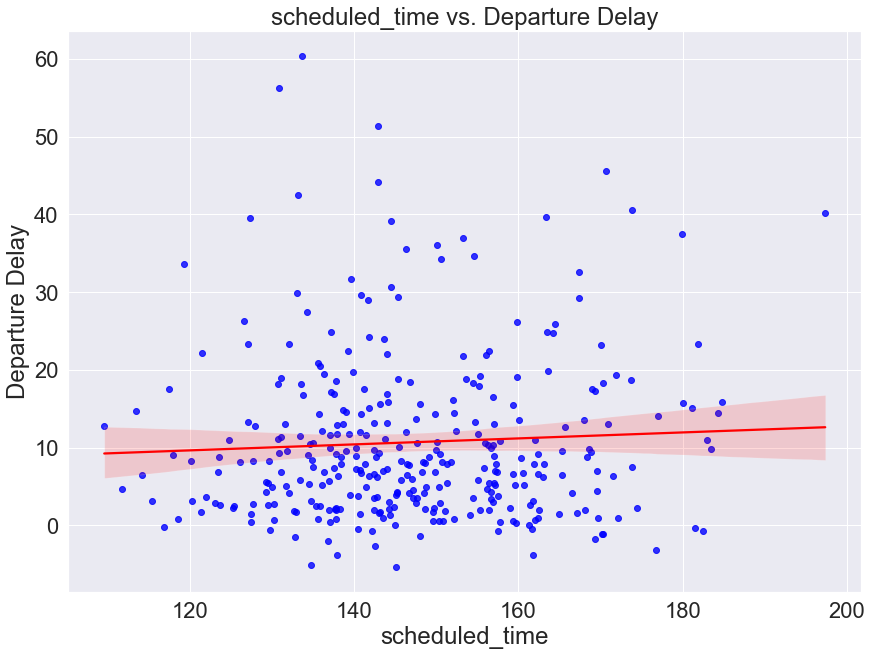

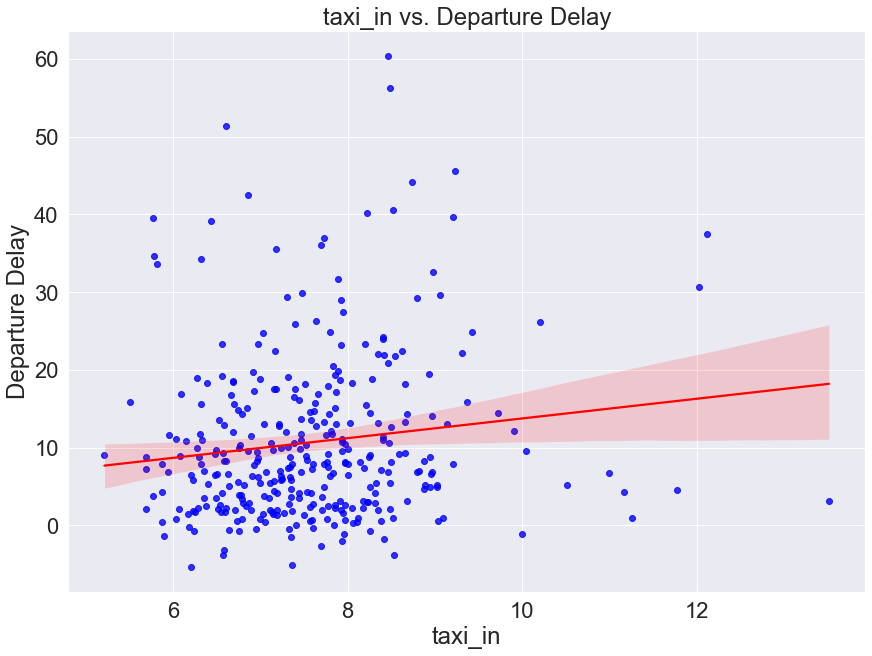

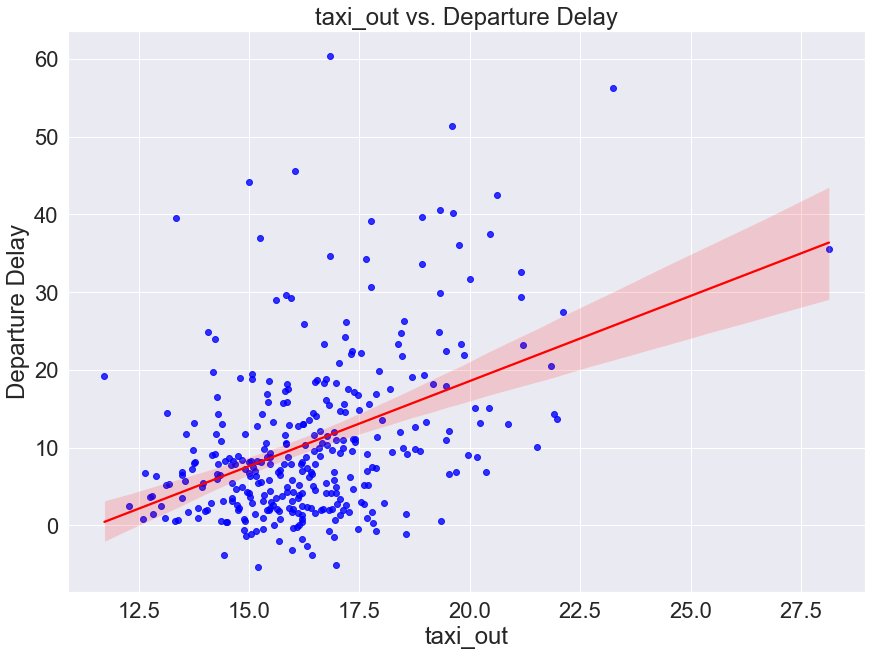

In [164]:
for i in departure_v_doy.columns:
    if (departure_v_doy[str(i)].dtype == 'int64' or departure_v_doy[str(i)].dtype == 'float64') and (str(i) != 'departure_delay') :
        plt.figure(figsize=(12,9), layout = 'constrained')
        #plt.scatter(jitter(flights_sample[i],0),jitter(flights_sample['departure_delay'],0))
        sns.regplot(x = departure_v_doy[i], y = departure_v_doy['departure_delay'],color = 'blue', line_kws = {'color':'red'})
        plt.title(str(i) + ' vs. Departure Delay')
        plt.xlabel(str(i))
        plt.ylabel('Departure Delay')
        # Show/save figure as desired.
        plt.show()
    else:
        continue

In [160]:
# Find days that are missing from the sample data that we have earlier collected.
missingdays = sorted(set(range(departure_v_doy.reset_index()['day_of_year'][0],departure_v_doy.reset_index()['day_of_year'][333])) - set(departure_v_doy.reset_index()['day_of_year']))
missingdays

[274,
 275,
 276,
 277,
 278,
 279,
 280,
 281,
 282,
 283,
 284,
 285,
 286,
 287,
 288,
 289,
 290,
 291,
 292,
 293,
 294,
 295,
 296,
 297,
 298,
 299,
 300,
 301,
 302,
 303,
 304]

**EDA:** Days 274 to 304 are missing from the flights data that we have compiled and read for an unknown reason. It seems that the data might have been corrupted, and hence, discarded by the entity that has produced and published this data.

# Linear Regression Model Generation

#### Baseline Model

#### Optimized Model

# Miscellaneous

In [ ]:
#Grouping the observations by 'country'
grouped = flights_sample.groupby(['airline','city']).mean()[['departure_delay','day_of_year']]
grouped

In [ ]:
flights_sample._get_numeric_data()